<table align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/hccho2/DL-UPMTP/blob/master/DL-TF-TORCH-CH7-Image-Model.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />구글 코랩에서 실행하기</a>
  </td>
</table>

In [ ]:
!pip install torchinfo

In [ ]:
import torch # 1.12.0+cu113
import torchvision
import numpy as np
import torchvision.datasets as datasets
from torch.utils.data import Dataset
import torchvision.transforms as transforms
import time
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchinfo import summary

# 7.1 MNIST 이미지 분류

## 7.1.1 Pytorch CNN Model

In [ ]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307),(0.3081))])
download_root = '.'
train_dataset = datasets.MNIST(download_root, transform=transform, train=True, download=True) #(1,28,28)
test_dataset = datasets.MNIST(download_root, transform=transform, train=False, download=True)

100%|██████████| 9912422/9912422 [00:00<00:00, 93220546.61it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 45832649.95it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw




100%|██████████| 1648877/1648877 [00:00<00:00, 31320837.09it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 8243413.57it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
batch_size = 128
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

### 모델 구현

In [ ]:
class CNNModel(torch.nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.drop_rate = 0.3

        self.L1 = torch.nn.Sequential(
            torch.nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1),  # (28,28,32)
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(kernel_size=2, stride=2),  # (14,14,32)
            torch.nn.Dropout(p=self.drop_rate))

        self.L2 = torch.nn.Sequential(
            torch.nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),  #(14,14,64)
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(kernel_size=2, stride=2), #(7,7,64)
            torch.nn.Dropout(p=self.drop_rate))

        self.L3 = torch.nn.Sequential(
            torch.nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1), # (7,7,128)
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(kernel_size=2, stride=2, padding=1), # (4,4,128)
            torch.nn.Dropout(p=self.drop_rate))

        self.L4 = torch.nn.Sequential(
            torch.nn.Linear(4 * 4 * 128, 512, bias=True),
            torch.nn.ReLU(),
            torch.nn.Dropout(p=self.drop_rate))

        self.L5 = torch.nn.Linear(512, 10, bias=True)

    def forward(self, x):
        out = self.L1(x)
        out = self.L2(out)
        out = self.L3(out)
        out = torch.flatten(out,start_dim=1) #(N,4*4*128)
        out = self.L4(out)
        out = self.L5(out)
        return out # logit

In [ ]:
learning_rate = 0.001
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('device: ', device)
model = CNNModel().to(device)
# Loss and optimizer
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

summary(model)

device:  cpu


Layer (type:depth-idx)                   Param #
CNNModel                                 --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       320
│    └─ReLU: 2-2                         --
│    └─MaxPool2d: 2-3                    --
│    └─Dropout: 2-4                      --
├─Sequential: 1-2                        --
│    └─Conv2d: 2-5                       18,496
│    └─ReLU: 2-6                         --
│    └─MaxPool2d: 2-7                    --
│    └─Dropout: 2-8                      --
├─Sequential: 1-3                        --
│    └─Conv2d: 2-9                       73,856
│    └─ReLU: 2-10                        --
│    └─MaxPool2d: 2-11                   --
│    └─Dropout: 2-12                     --
├─Sequential: 1-4                        --
│    └─Linear: 2-13                      1,049,088
│    └─ReLU: 2-14                        --
│    └─Dropout: 2-15                     --
├─Linear: 1-5                            5,130
Total pa

In [ ]:
num_epochs = 20  # GPU: 10sec/epoch  CPU: 105sec/epoch

n_total_steps = len(train_loader)
s_time = time.time()
for epoch in range(num_epochs):
    model.train()
    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 100 == 0:
            print (f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{n_total_steps}], Loss: {loss.item():.4f}, elapsed: {time.time()-s_time:,.2f}')

    model.eval()
    with torch.no_grad():
        n_correct = 0
        n_samples = 0
        for images, labels in test_loader:

            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            # max returns (value ,index)
            _, predicted = torch.max(outputs.data, 1)
            n_samples += labels.size(0)
            n_correct += (predicted == labels).sum().item()

        acc = 100.0 * n_correct / n_samples
        print(f'Accuracy of the network on the 10000 test images: {acc} %')

model_filename = f'mnist_cnn_{num_epochs}.pt'
torch.save(model.state_dict(), model_filename)
print(f'model saved: {model_filename}')

Epoch [1/20], Step [100/469], Loss: 0.1132, elapsed: 4.46
Epoch [1/20], Step [200/469], Loss: 0.1273, elapsed: 6.17
Epoch [1/20], Step [300/469], Loss: 0.2423, elapsed: 7.91
Epoch [1/20], Step [400/469], Loss: 0.1164, elapsed: 9.62
Accuracy of the network on the 10000 test images: 98.66 %
Epoch [2/20], Step [100/469], Loss: 0.1211, elapsed: 13.80
Epoch [2/20], Step [200/469], Loss: 0.0080, elapsed: 15.53
Epoch [2/20], Step [300/469], Loss: 0.0945, elapsed: 17.23
Epoch [2/20], Step [400/469], Loss: 0.0490, elapsed: 18.97
Accuracy of the network on the 10000 test images: 98.89 %
Epoch [3/20], Step [100/469], Loss: 0.0441, elapsed: 23.12
Epoch [3/20], Step [200/469], Loss: 0.0459, elapsed: 24.84
Epoch [3/20], Step [300/469], Loss: 0.0677, elapsed: 26.58
Epoch [3/20], Step [400/469], Loss: 0.0322, elapsed: 28.30
Accuracy of the network on the 10000 test images: 99.11 %
Epoch [4/20], Step [100/469], Loss: 0.0258, elapsed: 32.53
Epoch [4/20], Step [200/469], Loss: 0.0433, elapsed: 34.28
Epoc

### Drawing & Predict
- Google Colab에서는 X-Window System이 지원되지 않는다. Local PC에서 실행해야 한다.
- https://github.com/hccho2/DL-UPMTP/blob/main/data_and_saved_models/ch7/mnist_prediction.py
- https://github.com/hccho2/DL-UPMTP/blob/main/data_and_saved_models/ch7/mnist_cnn_20.pt

2개 파일(mnist_prediction.py, mnist_cnn_20.pt)을 같은 디렉토리에 두고...
> python mnist_prediction.py mnist_cnn_20.pt

검은 바탕에 마우스로 숫자를 그린 후, 'd'를 누르면 된다.

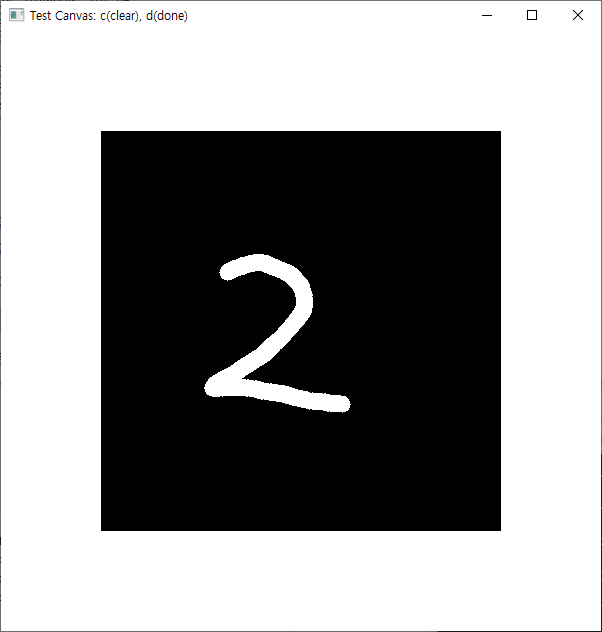

In [ ]:
import cv2
from PIL import Image
import numpy as np
import ctypes
import matplotlib.pyplot as plt

In [ ]:
transform_test = transforms.Compose([transforms.Grayscale(num_output_channels=1),
                                transforms.Resize((28,28),interpolation=transforms.InterpolationMode.BILINEAR),
                                transforms.ToTensor(),
                                transforms.Normalize((0.1307,),(0.3081,))
                                    ])
def predict(model,img):
    # img: PIL.Image.Image
    model.eval()
    img_tensor = transform_test(img).unsqueeze(0).to(device) # (1,1,28,28)
    prob = model(img_tensor).softmax(-1).to('cpu').detach().numpy()
    return prob[0]

prediction:  3
top 3 probability: 
3: 99.53%
5: 0.19%
7: 0.13%


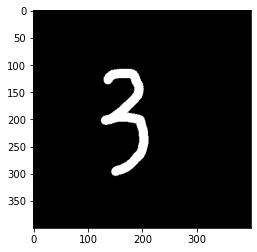

In [ ]:
######################### Model Loading  ############################################
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#model = NeuralNet(input_size, hidden_size, num_classes).to(device)
model = CNNModel().to(device)

model_filename = './mnist_cnn_20.pt'

model.load_state_dict(torch.load(model_filename, map_location = device))
model.eval()

# 600 x 600 크기의 canvas 생성  --> 테두리 100 만큼은 유효영역에서 제외
canvas = np.ones((600,600), dtype="uint8") * 255 # 255=white

canvas[100:500,100:500] = 0 # 0 = black

start_point = None
end_point = None
is_drawing = False

def draw_line(img,start_at,end_at):
    cv2.line(img,start_at,end_at,255,15)  # (이미지,시작점,종료점,색상,두께)

def on_mouse_events(event,x,y,flags,params):
    global start_point
    global end_point
    global canvas
    global is_drawing
    if event == cv2.EVENT_LBUTTONDOWN:
        if is_drawing == False:
            is_drawing=True
            start_point = (x,y)
    elif event == cv2.EVENT_MOUSEMOVE:
        if is_drawing:
            end_point = (x,y)
            draw_line(canvas,start_point,end_point)
            start_point = end_point
    elif event == cv2.EVENT_LBUTTONUP:
        is_drawing = False

name = "Test Canvas: c(clear), d(done)"
cv2.namedWindow(name)
cv2.setMouseCallback(name, on_mouse_events)


while(True):
    cv2.imshow(name, canvas)
    key = cv2.waitKey(1) & 0xFF
    if key == ord('c'):
        canvas[100:500,100:500] = 0
    elif key == ord('d'):
        drawing_image = canvas[100:500,100:500] # drawing_image: uint8(0~255) numpy array(400,400) --> 0 또는 255 밖에 없다. 중간 값이 없다.
        break

cv2.destroyAllWindows()
plt.imshow(drawing_image,cmap='gray')

draw_image=Image.fromarray(drawing_image) # PIL.Image.Image
prob = predict(model,draw_image) # 확률값 return

pred = np.argsort(prob)[::-1]  # 정렬 내림차순
prob=prob[pred]

ctypes.windll.user32.MessageBoxW(0, str(pred[0]), "Prediction", 0)

print('prediction: ', pred[0])
print('top 3 probability: ')
for i in range(3):
    print(f'{pred[i]}: {prob[i]*100:.2f}%')

## 7.1.2 Tensorflow CNN Model
- pytorch로 구현한 것과 같은 모델을 Tensorflow로 구현

In [ ]:
import tensorflow as tf

In [ ]:
class CNNModelTF(tf.keras.Model):
    def __init__(self):
        super(CNNModelTF, self).__init__()
        self.drop_rate = 0.3

        self.L1 = tf.keras.models.Sequential()
        self.L1.add(tf.keras.layers.Conv2D(32, kernel_size=3, padding='same',activation='relu'))  # (28,28,32)
        self.L1.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))  # (14,14,32)
        self.L1.add(tf.keras.layers.Dropout(self.drop_rate))

        self.L2 = tf.keras.models.Sequential()
        self.L2.add(tf.keras.layers.Conv2D(64, kernel_size=3, padding='same',activation='relu'))  #(14,14,64)
        self.L2.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))  # (7,7,64)
        self.L2.add(tf.keras.layers.Dropout(self.drop_rate))

        self.L3 = tf.keras.models.Sequential()
        self.L3.add(tf.keras.layers.Conv2D(128, kernel_size=3, padding='same',activation='relu'))  # (7,7,128)
        self.L3.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2,padding='same'))  # (4,4,128)
        self.L3.add(tf.keras.layers.Dropout(self.drop_rate))

        self.L4 = tf.keras.models.Sequential()
        self.L4.add(tf.keras.layers.Flatten())
        self.L4.add(tf.keras.layers.Dense(512,activation='relu'))
        self.L4.add(tf.keras.layers.Dropout(self.drop_rate))

        self.L5 = tf.keras.layers.Dense(10,activation=None)

    def call(self, x, training=None):
        # x: (N,28,28,1)
        out = self.L1(x,training)
        out = self.L2(out,training)
        out = self.L3(out,training)
        out = self.L4(out,training)
        out = self.L5(out)
        return out

In [ ]:
model_tf = CNNModelTF()
model_tf.build((None,28,28,1))
model_tf.summary()

Model: "cnn_model_tf_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_20 (Sequential)  (None, 14, 14, 32)        320       
                                                                 
 sequential_21 (Sequential)  (None, 7, 7, 64)          18496     
                                                                 
 sequential_22 (Sequential)  (None, 4, 4, 128)         73856     
                                                                 
 flatten_10 (Flatten)        multiple                  0 (unused)
                                                                 
 sequential_23 (Sequential)  (None, 512)               1049088   
                                                                 
 dense_11 (Dense)            multiple                  5130      
                                                                 
Total params: 1,146,890
Trainable params: 1,146,890


# 7.2 Image Data Augmentation
- dog.jpg 파일 필요: https://github.com/hccho2/DL-UPMTP/blob/main/etc/dog.jpg

In [ ]:
! wget https://github.com/hccho2/DL-UPMTP/raw/main/etc/dog.jpg

--2023-09-25 04:36:55--  https://github.com/hccho2/DL-UPMTP/raw/main/etc/dog.jpg
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/hccho2/DL-UPMTP/main/etc/dog.jpg [following]
--2023-09-25 04:36:56--  https://raw.githubusercontent.com/hccho2/DL-UPMTP/main/etc/dog.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 376333 (368K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>] 367.51K  --.-KB/s    in 0.03s   

2023-09-25 04:36:56 (12.3 MB/s) - ‘dog.jpg’ saved [376333/376333]



## 7.2.1 Tensorflow Image Augmentation 1


### Image Augmentation #1: Layer 활용

In [ ]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
L = tf.keras.Sequential([
      tf.keras.layers.experimental.preprocessing.Resizing(180, 180),
      tf.keras.layers.RandomCrop(150,150),
      tf.keras.layers.experimental.preprocessing.Rescaling(1./255)])

Text(0.5, 1.0, 'resize and random crop #2')

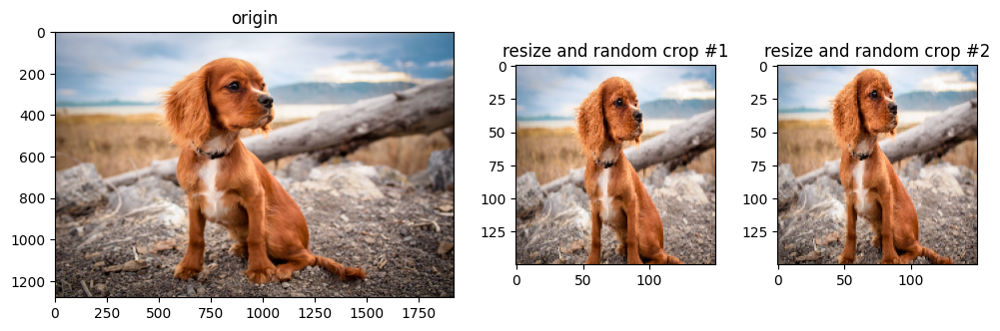

In [ ]:
img = Image.open('dog.jpg') # (1920, 1280)
fig, ax = plt.subplots(1, 3, gridspec_kw={'width_ratios': [2,1,1]},figsize=(10,5))
fig.tight_layout()

ax[0].imshow(img)
ax[0].set_title('origin')
ax[1].imshow(L(np.array(img)))
ax[1].set_title('resize and random crop #1')
ax[2].imshow(L(np.array(img)))
ax[2].set_title('resize and random crop #2')

### hymenoptera dataset
- https://download.pytorch.org/tutorial/hymenoptera_data.zip
- train: ants(123개), bees(121개)
- val: ants(70개), bees(83개)

* train/ants에 잘못된 파일이 하나 포함되어 있다. imageNotFound.gif
* 파일갯수 확인: !find ./hymenoptera_data/train/ants -type f | wc -l

In [ ]:
!wget https://download.pytorch.org/tutorial/hymenoptera_data.zip
!unzip -qq hymenoptera_data.zip
!rm ./hymenoptera_data/train/ants/imageNotFound.gif  # 잘못된 파일 제거

--2023-09-25 04:40:19--  https://download.pytorch.org/tutorial/hymenoptera_data.zip
Resolving download.pytorch.org (download.pytorch.org)... 18.65.3.71, 18.65.3.38, 18.65.3.63, ...
Connecting to download.pytorch.org (download.pytorch.org)|18.65.3.71|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47286322 (45M) [application/zip]
Saving to: ‘hymenoptera_data.zip’

hymenoptera_data.zi 100%[===================>]  45.10M   156MB/s    in 0.3s    

2023-09-25 04:40:20 (156 MB/s) - ‘hymenoptera_data.zip’ saved [47286322/47286322]



In [ ]:
# small 디렉토리를 만들고, 개미,벌 이미지 4개씩 복사.
! mkdir -p ./hymenoptera_data/small/{ants,bees}  # -p옵션: 중간 디렉토리 생성
! cp ./hymenoptera_data/train/ants/{0013035.jpg,5650366_e22b7e1065.jpg,6240329_72c01e663e.jpg,201558278_fe4caecc76.jpg} ./hymenoptera_data/small/ants
! cp ./hymenoptera_data/train/bees/{16838648_415acd9e3f.jpg,17209602_fe5a5a746f.jpg,205835650_e6f2614bee.jpg,208702903_42fb4d9748.jpg} ./hymenoptera_data/small/bees

### Image Augmentation #2: ImageDataGenerator

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

ImageDataGenerator 기본

In [ ]:
data_dir = './hymenoptera_data/small'   # 테스트를 위해, data몇개만 모아, 작은 dataset을 만듬.

train_datagen = ImageDataGenerator(rescale=1./255, shear_range=30, zoom_range=0.2, horizontal_flip=True)

#class_mode='categorical'  ==> label을 onehot으로 만들어서 return한다.
train_generator = train_datagen.flow_from_directory(data_dir, target_size=(150, 150), batch_size=8,class_mode='categorical',shuffle=False)
# 무한 반복
class_names = list(train_generator.class_indices.keys())  # ['ants', 'bees']
print('class name: ', class_names) # ['ants', 'bees']

print('batch_size = ',  train_generator.batch_size, 'image shape: ', train_generator.image_shape)
print(type(train_datagen), type(train_generator))  # tf.data.Dataset은 아님. isinstance(train_generator,tf.data.Dataset) -> False

Found 8 images belonging to 2 classes.
class name:  ['ants', 'bees']
batch_size =  8 image shape:  (150, 150, 3)
<class 'keras.preprocessing.image.ImageDataGenerator'> <class 'keras.preprocessing.image.DirectoryIterator'>


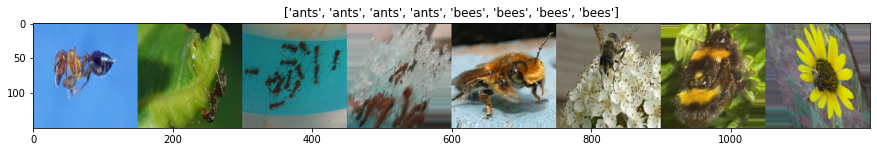

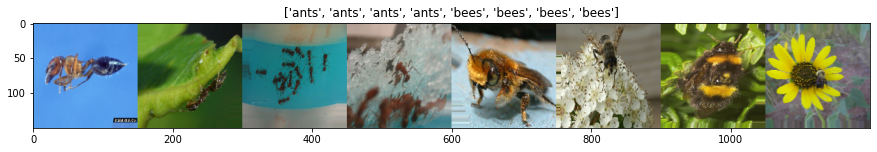

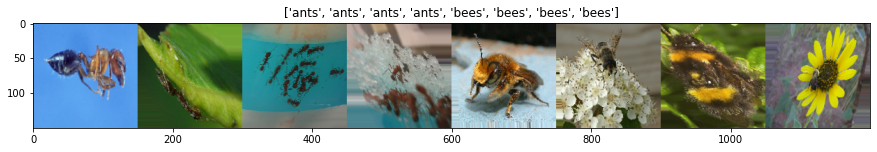

In [ ]:
for i, data in enumerate(train_generator):
    inputs, classes = data
    inputs = np.concatenate(inputs, axis=1)  # (N,150,150,3)  ==> (150,750,3)
    classes = classes.argmax(axis=-1)
    plt.figure(figsize=(15,35))
    plt.imshow(inputs)
    plt.title([class_names[x] for x in classes])
    plt.show()

    if i==2: break  # 무한 반복이기 때문에 필요.

In [ ]:
len(train_generator)

## 7.2.2 Image Augmentation 기법들

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
!mkdir -p ./temp/dog
! for i in {1..5}; do cp dog.jpg ./temp/dog/dog$i.jpg; done

In [ ]:
def get_sample(train_datagen):
    data_dir = './temp'
    train_generator = train_datagen.flow_from_directory(data_dir, target_size=(150, 150), batch_size=5,class_mode='categorical',shuffle=False)
    imgs,_ = next(iter(train_generator))
    imgs = np.concatenate(imgs, axis=1)  # (N,150,150,3)  ==> (150,750,3)
    plt.figure(figsize=(15,35))
    plt.imshow(imgs)
    plt.show()

### horizontal_flip

Found 5 images belonging to 1 classes.


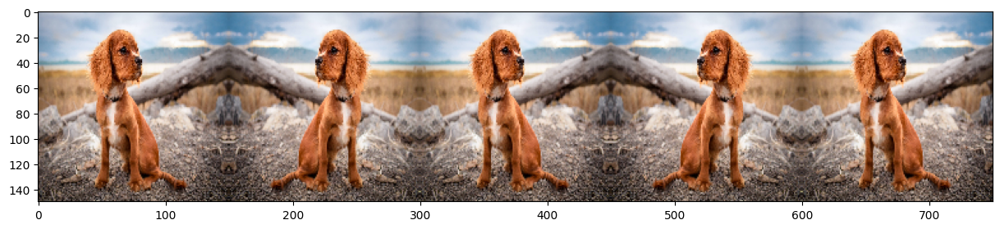

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255,horizontal_flip=True)

get_sample(train_datagen)

### zoom_range

Found 5 images belonging to 1 classes.


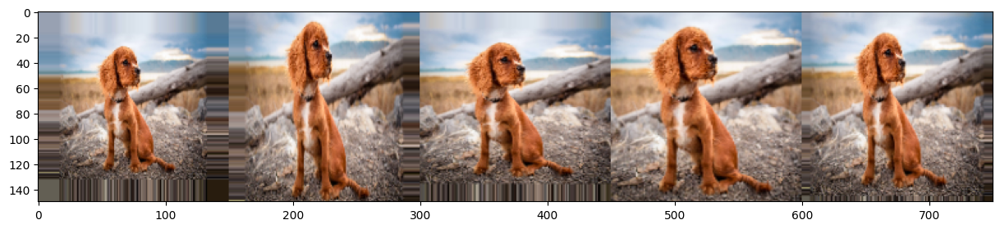

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255,zoom_range=0.3)  # [1-zoom_range, 1+zoom_range]

get_sample(train_datagen)

### shear_range

Found 5 images belonging to 1 classes.


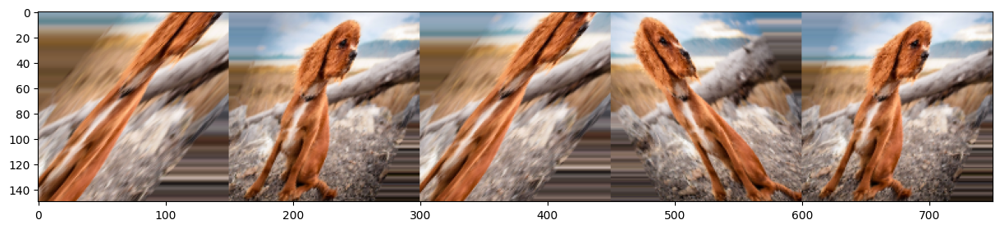

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255,shear_range=60)  # 전단변환. Shear Intensity(각도). 사각형->평행사변형으로 변환

get_sample(train_datagen)

### rotation

Found 5 images belonging to 1 classes.


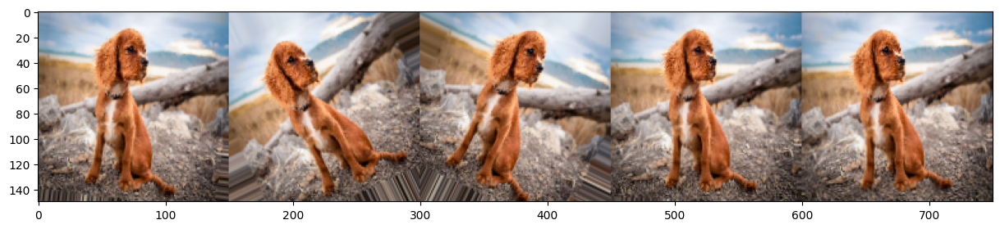

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255,rotation_range=30)  # 회전(각도)

get_sample(train_datagen)

### width shift

Found 5 images belonging to 1 classes.


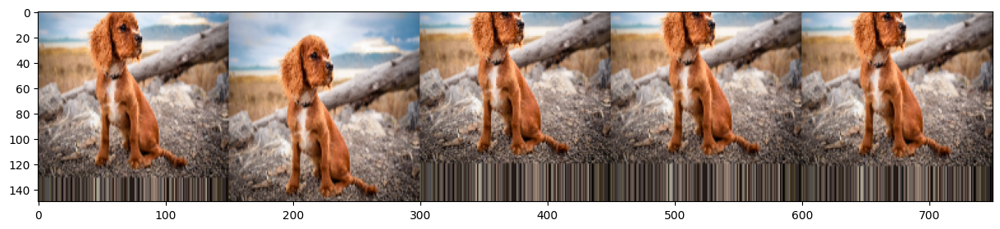

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255,width_shift_range=0.2)  # 좌우 이동

get_sample(train_datagen)

Found 5 images belonging to 1 classes.


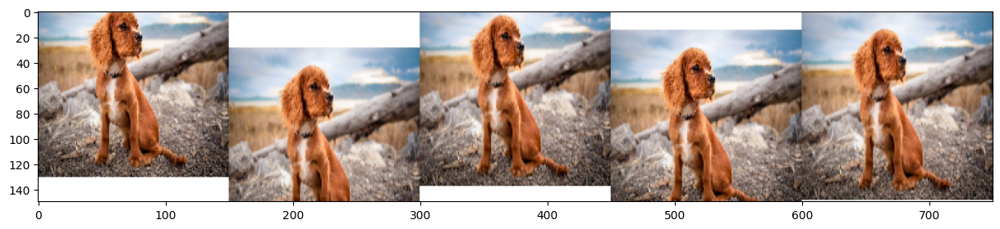

In [ ]:
# cval=0 --> 검은색, cval=255 --> 흰색
train_datagen = ImageDataGenerator(rescale=1./255,width_shift_range=0.2,fill_mode='constant',cval=255)  # 좌우 이동

get_sample(train_datagen)

### brightness_range

Found 5 images belonging to 1 classes.


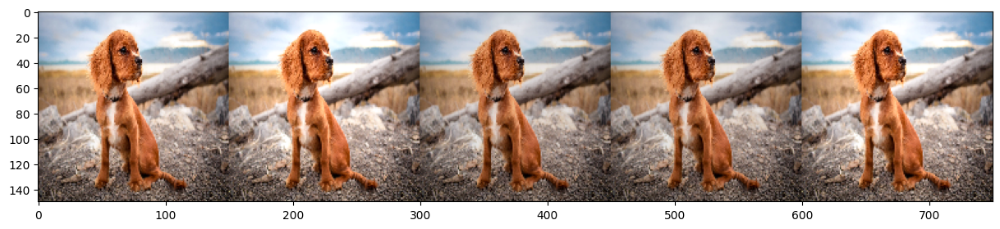

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255,brightness_range=[0.9,1.1])  #

get_sample(train_datagen)

## 7.2.3 Tensorflow Image Augmentation 2
- ImageDataGenerator + preprocessing_function
- target_size로 변환된 이미지가 preprocessing_function으로 넘어간다.

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

In [ ]:
def my_preprocessing(image):
    # image: numpy array(0-255값의 float). target_size로 변환된 데이터가 넘어온다.
    # ImageDataGenerator에 Augmentation option이 넘어갔다면, 이미 적용된 데이터가 넘어온다.
    image = image/255.   # 넘어온 image에는 target_size로 resize되면서 0-255사이의 float 값이 들어 있다.

    image = tf.image.random_flip_left_right(image)  # 확률 50%로 고정되어 있음.
    image = tf.image.random_brightness(image, max_delta=0.3)
    image = tf.image.random_saturation(image, lower=0.5, upper=1.5)  # 채도 조절

    # random crop
    image = tf.image.random_crop(image,(130,130,3))
    image = tf.image.resize(image,(150,150)) # target_size와 일치해야 한다.

    image = tf.clip_by_value(image, 0.0, 1.0) # image = np.clip(image,0.0, 1.0)


    return image

In [ ]:
data_dir = './hymenoptera_data/small'   # 테스트를 위해, data몇개만 모아, 작은 dataset을 만듬.
train_datagen = ImageDataGenerator(preprocessing_function=my_preprocessing,rotation_range=180)

train_generator = train_datagen.flow_from_directory(data_dir, target_size=(150,150), batch_size=8,class_mode='categorical',shuffle=False)  # target_size로 preprocessing에서 처리한 크기가 넘어가야 한다.


Found 8 images belonging to 2 classes.


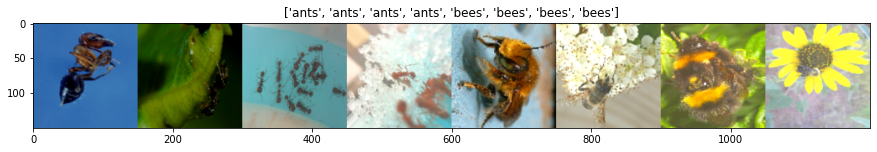

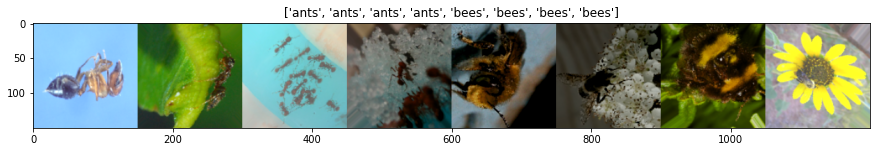

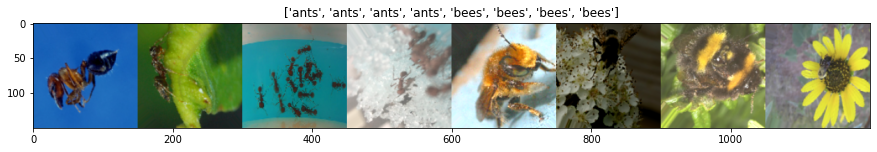

In [ ]:
class_names = list(train_generator.class_indices.keys())
for i in range(3):
    inputs, classes = next(iter(train_generator))
    inputs = np.concatenate(inputs, axis=1)
    classes = classes.argmax(axis=-1)
    plt.figure(figsize=(15,35))
    plt.imshow(inputs)
    plt.title([class_names[x] for x in classes])
    plt.show()

## 7.2.4 Tensorflow Image Augmentation 3
- tf.keras.utils.image_dataset_from_directory + map

In [ ]:
data_dir = './hymenoptera_data/small'   # 테스트를 위해, data몇개만 모아, 작은 dataset을 만듬.
dataset = tf.keras.utils.image_dataset_from_directory(data_dir, batch_size=None, image_size=(170, 170),shuffle=False)
print(dataset.class_names) # ['ants', 'bees']

Found 8 files belonging to 2 classes.
['ants', 'bees']


In [ ]:
def my_preprocessing2(image):
    # image: Tensorflow Tensor
    image = image/255.

    image = tf.image.random_flip_left_right(image)  # 확률 50%로 고정되어 있음.
    image = tf.image.random_brightness(image, max_delta=0.3)
    image = tf.image.random_saturation(image, lower=0.5, upper=1.5)  # 채도 조절

    # random crop
    image = tf.image.random_crop(image,(150,150,3))
    image = tf.clip_by_value(image, 0.0, 1.0)

    return image
dataset_batch = dataset.map(lambda x,y: (my_preprocessing2(x),y)).batch(8)

In [ ]:
for d in dataset_batch:
    print(d[0].shape, d[1])

(8, 150, 150, 3) tf.Tensor([0 0 0 0 1 1 1 1], shape=(8,), dtype=int32)


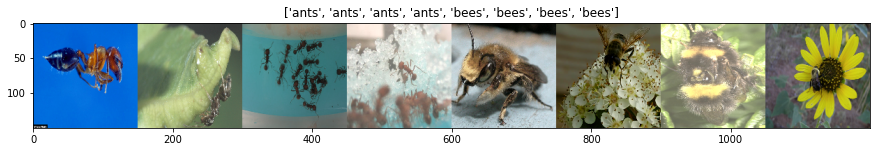

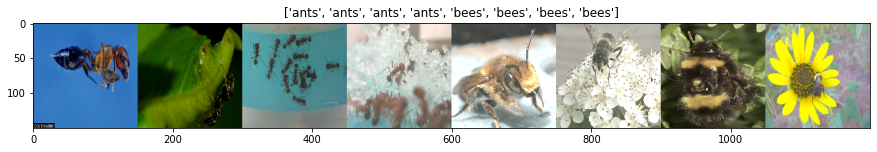

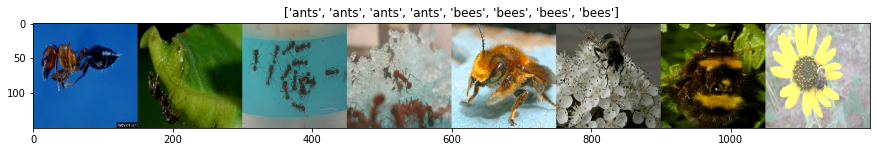

In [ ]:
for i in range(3):
    inputs, classes = next(iter(dataset_batch))
    inputs = np.concatenate(inputs.numpy(), axis=1)
    plt.figure(figsize=(15,35))
    plt.imshow(inputs)
    plt.title([dataset.class_names[x] for x in classes])
    plt.show()

## 7.2.5 Pytorch Image Augmentation

In [ ]:
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torch
import torchvision
from torch.utils.data import Dataset

In [ ]:
data_dir = './hymenoptera_data/small'   # 테스트를 위해, data몇개만 모아, 작은 dataset을 만듬.

data_transforms = transforms.Compose([
    transforms.RandomResizedCrop(size=(150,150),scale=(0.7, 1.0),ratio=(0.9,1.1)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset =  datasets.ImageFolder(data_dir, data_transforms)
class_names = train_dataset.classes # ['ants', 'bees']
print(class_names)

dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=8,shuffle=False)

['ants', 'bees']


In [ ]:
isinstance(train_dataset,Dataset), train_dataset

(True, Dataset ImageFolder
     Number of datapoints: 8
     Root location: ./hymenoptera_data/small
     StandardTransform
 Transform: Compose(
                RandomResizedCrop(size=(150, 150), scale=(0.7, 1.0), ratio=(0.9, 1.1), interpolation=bilinear)
                RandomHorizontalFlip(p=0.5)
                ToTensor()
                Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ))

In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))  # (C,H,W) -> (H,W,C)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15,15))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

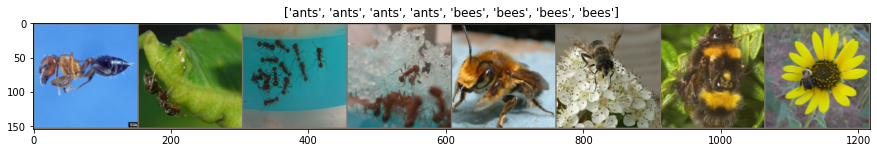

0 tensor([0, 0, 0, 0, 1, 1, 1, 1]) torch.Size([8, 3, 150, 150])


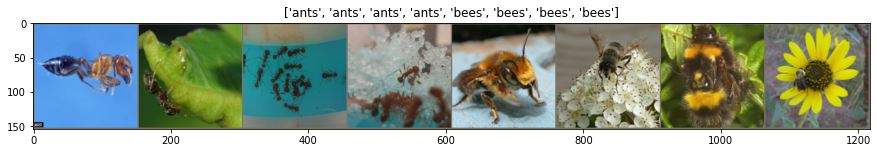

1 tensor([0, 0, 0, 0, 1, 1, 1, 1]) torch.Size([8, 3, 150, 150])


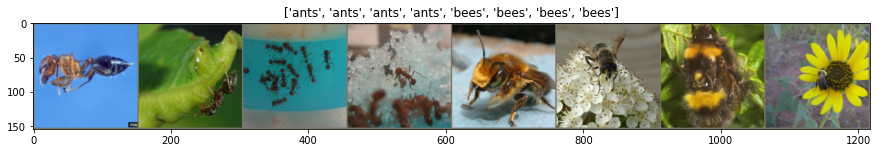

2 tensor([0, 0, 0, 0, 1, 1, 1, 1]) torch.Size([8, 3, 150, 150])


In [ ]:
for i in range(3):
    inputs,classes = next(iter(dataloader))
    out = torchvision.utils.make_grid(inputs)  # inputs: (8, 3, 150, 150)  ---> out: (3, 154, 1218)
    imshow(out, title=[class_names[x] for x in classes])
    print(i, classes, inputs.shape)

In [ ]:
inputs.shape

torch.Size([8, 3, 150, 150])

# 7.3 CNN 이미지 모델

## 7.3.1 VGG

In [ ]:
import torch
import torch.nn as nn

### VGG - naive - Pytorch

In [ ]:
class VGG_naive(nn.Module):

    def __init__(self, num_classes=1000):
        super(VGG, self).__init__()
        self.L1 = nn.Sequential(
            nn.Conv2d(3,64,3,stride=1,padding=1),  # in_channels, out_channels, kernel_size
            nn.ReLU(inplace=True),
            nn.Conv2d(64,64,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2,2)
        )
        self.L2 = nn.Sequential(
            nn.Conv2d(64,128,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128,128,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2,2)
        )
        self.L3 = nn.Sequential(
            nn.Conv2d(128,256,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256,256,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256,256,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2,2)
        )
        self.L4 = nn.Sequential(
            nn.Conv2d(256,512,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512,512,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512,512,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2,2)
        )
        self.L5 = nn.Sequential(
            nn.Conv2d(512,512,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512,512,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512,512,3,stride=1,padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2,2)
        )
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(True),
            nn.Dropout(p=0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.L1(x)
        x = self.L2(x)
        x = self.L3(x)
        x = self.L4(x)
        x = self.L5(x)
        x = torch.flatten(x,start_dim=1)  # Flatten
        x = self.classifier(x)
        return x

In [ ]:
model = VGG_naive(1000)
x = torch.randn(1,3,224,224)
y = model(x)

In [ ]:
y.shape

torch.Size([1, 1000])

### VGG - structured - Pytorch





In [ ]:
!pip install torchinfo

In [ ]:
from torchinfo import summary

In [ ]:
class VGG(nn.Module):
    def __init__(self, features, num_classes=1000):
        super(VGG, self).__init__()
        self.features = features
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

def make_layers(cfg, batch_norm=False):
    layers = []
    in_channels = 3
    for v in cfg:
        if v == 'M':
            layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
        else:
            conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=1)
            if batch_norm:
                layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)]
            in_channels = v
    return nn.Sequential(*layers)

cfg = {
    'vgg16': [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512, 'M', 512, 512, 512, 'M'],
    'vgg19': [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 256, 'M', 512, 512, 512, 512, 'M', 512, 512, 512, 512, 'M'],
}

In [ ]:
vgg16 = VGG(make_layers(cfg['vgg16']),num_classes=1000 )
vgg19 = VGG(make_layers(cfg['vgg19'],batch_norm=True),num_classes=1000 )


In [ ]:
summary(vgg16,input_size=(1,3,224,224))

Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      --                        --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         36,928
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        73,856
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        147,584
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]          29

In [ ]:
x = torch.randn(1,3,224,224)
summary(vgg16,input_data=x)

Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      --                        --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         36,928
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        73,856
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        147,584
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]          29

In [ ]:
x = torch.randn(1,3,224,224)
summary(vgg19,input_data=x)

Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      --                        --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─BatchNorm2d: 2-2                  [1, 64, 224, 224]         128
│    └─ReLU: 2-3                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-4                       [1, 64, 224, 224]         36,928
│    └─BatchNorm2d: 2-5                  [1, 64, 224, 224]         128
│    └─ReLU: 2-6                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-7                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        73,856
│    └─BatchNorm2d: 2-9                  [1, 128, 112, 112]        256
│    └─ReLU: 2-10                        [1, 128, 112, 112]        --
│    └─Conv2d: 2-11                      [1, 128, 112, 112]        147,

### VGG Preprocessing

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np

In [ ]:
def preprocess_image(x):
    mean = [103.939, 116.779, 123.68]  # BGR
    x = x[...,::-1]  # RGB --> BGR
    x[...,0] -= mean[0]
    x[...,1] -= mean[1]
    x[...,2] -= mean[2]

    return x

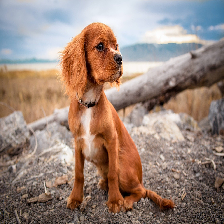

In [ ]:
img

In [ ]:
img_processed = tf.keras.applications.vgg16.preprocess_input(np.array(img))  # uint8 --> float32
img_processed2 = preprocess_image(np.array(img).astype(np.float32))
img_processed3 = tf.keras.applications.resnet50.preprocess_input(np.array(img))  # uint8 --> float32

np.allclose(img_processed,img_processed2),np.allclose(img_processed2,img_processed3)

(True, True)

torchvision preprocessing

In [ ]:
import torchvision.transforms as transforms

In [ ]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                      std=[0.229, 0.224, 0.225])

train_transorms = transforms.Compose([
            transforms.RandomResizedCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            normalize,
        ])

val_transorms = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            normalize,
        ])

## 7.3.2 GoogLeNet(Inception v1)

### $1\times1$ convolution

In [ ]:
import numpy as np
import tensorflow as tf

In [ ]:
N=2; H=W=7; C_in=128; C_out=64

In [ ]:
x = np.random.randn(N,H,W,C_in)
weight = np.random.randn(C_in,C_out)
y1 = tf.nn.conv2d(x,weight[None,None],strides=1,padding='VALID')  # weight[None,None]: (1,1,C_in,C_out)
y2 = np.matmul(x,weight)
np.allclose(y1,y2)  # True

True

True

In [ ]:
y1.shape,y2.shape

(TensorShape([2, 5, 5, 5]), (2, 5, 5, 5))

### GoogLeNet - Tensorflow

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D,MaxPool2D,Concatenate,AveragePooling2D,Flatten,Dense,Dropout,GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.preprocessing import image
import math
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os,time
import random

Tensorflow Seed 고정:
- https://www.tensorflow.org/api_docs/python/tf/keras/utils/set_random_seed
- https://www.tensorflow.org/api_docs/python/tf/config/experimental/enable_op_determinism

In [ ]:
#np.random.seed(100);  tf.random.set_seed(100); random.seed(100)
tf.keras.utils.set_random_seed(100)
tf.config.experimental.enable_op_determinism()   # 실행 속도가 느려진다.

In [ ]:
def inception_module(input,Filters,name=None):
    # Filters: eg. inception (3a) --> [64,96,128,16,32,32]
    F_1x1,F_3x3_reduce,F_3x3,F_5x5_reduce,F_5x5,F_pool_proj = Filters

    conv_1x1 = Conv2D(F_1x1, (1, 1), padding='same', activation='relu')(input)

    conv_3x3 = Conv2D(F_3x3_reduce, (1, 1), padding='same', activation='relu')(input)
    conv_3x3 = Conv2D(F_3x3, (3, 3), padding='same', activation='relu')(conv_3x3)

    conv_5x5 = Conv2D(F_5x5_reduce, (1, 1), padding='same', activation='relu')(input)
    conv_5x5 = Conv2D(F_5x5, (5, 5), padding='same', activation='relu')(conv_5x5)

    pool_proj = MaxPool2D((3, 3), strides=(1, 1), padding='same')(input)
    pool_proj = Conv2D(F_pool_proj, (1, 1), padding='same', activation='relu')(pool_proj)

    output = Concatenate(axis=3,name=name)([conv_1x1, conv_3x3, conv_5x5, pool_proj])
    return output

In [ ]:
n_class = 10
input_layer = tf.keras.Input(shape=(224, 224, 3))

x = Conv2D(64, (7, 7), padding='same', strides=(2, 2), activation='relu', name='conv_1_7x7/2')(input_layer)
x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_1_3x3/2')(x)

x = Conv2D(64, (1, 1), padding='same', strides=(1, 1), activation='relu', name='conv_2a_3x3/1')(x)
x = Conv2D(192, (3, 3), padding='same', strides=(1, 1), activation='relu', name='conv_2b_3x3/1')(x)
x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_2_3x3/2')(x)

inception_3a_f = [64,96,128,16,32,32]
x = inception_module(x,inception_3a_f,name='inception_3a')

inception_3b_f = [128,128,192,32,96,64]
x = inception_module(x,inception_3b_f,name='inception_3b')

x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_3_3x3/2')(x)

inception_4_f = [[192,96,208,16,48,64],[160,112,224,24,64,64],[128,128,256,24,64,64],[112,144,288,32,64,64],[256,160,320,32,128,128]]

temp = []
for i in range(5):
    x = inception_module(x,inception_4_f[i],name=f'inception_4_{i}')
    temp.append(x)

# Auxiliary Classifier - 1
x1 = AveragePooling2D((5, 5), strides=3, padding='valid')(temp[0])
x1 = Conv2D(128, (1, 1), padding='same', activation='relu')(x1)
x1 = Flatten()(x1)
x1 = Dense(1024, activation='relu')(x1)
x1 = Dropout(0.7)(x1)
x1 = Dense(n_class, activation='softmax', name='auxilliary_classifier_1')(x1)

# Auxiliary Classifier - 2
x2 = AveragePooling2D((5, 5), strides=3, padding='valid')(temp[3])
x2 = Conv2D(128, (1, 1), padding='same', activation='relu')(x2)
x2 = Flatten()(x2)
x2 = Dense(1024, activation='relu')(x2)
x2 = Dropout(0.7)(x2)
x2 = Dense(n_class, activation='softmax', name='auxilliary_classifier_2')(x2)

x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_4_3x3/2')(x)  # x = temp[-1]

inception_5a_f = [256,160,320,32,128,128]
x = inception_module(x,inception_5a_f,name='inception_5a')

inception_5b_f = [384,192,384,48,128,128]
x = inception_module(x,inception_5b_f,name='inception_5b')

x = AveragePooling2D((7, 7), strides=1, padding='valid',name='avg_pool_7x7/1')(x)
x = Flatten()(x)
x = Dropout(0.4)(x)

x = Dense(n_class, activation='softmax', name='output')(x)

In [ ]:
model = tf.keras.Model(input_layer, [x, x1, x2], name='GoogLeNet')  # GoogLeNet  inception_v1  ---> Trainable params: 10,334,030

In [ ]:
model.summary()

Model: "GoogLeNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv_1_7x7/2 (Conv2D)          (None, 112, 112, 64  9472        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 max_pool_1_3x3/2 (MaxPooling2D  (None, 56, 56, 64)  0           ['conv_1_7x7/2[0][0]']           
 )                                                                                        

## 7.3.3 CIFAR-10 Dataset

In [ ]:
def preprocessing(imgs,img_size,labels):
    imgs = tf.image.resize(imgs, img_size)
    return imgs,(labels,labels,labels)

In [ ]:
batch_size = 64
img_size = (224,224)
(X_train, Y_train), (X_valid, Y_valid) = tf.keras.datasets.cifar10.load_data()
train_dataset = tf.data.Dataset.from_tensor_slices(((X_train/255.).astype(np.float32),Y_train.reshape(-1))).shuffle(buffer_size=10000,seed=100).batch(batch_size)
train_dataset = train_dataset.map(lambda x,y: preprocessing(x,img_size,y)).prefetch(128)

valid_dataset = tf.data.Dataset.from_tensor_slices(((X_valid/255.).astype(np.float32),Y_valid.reshape(-1))).batch(batch_size)
valid_dataset = valid_dataset.map(lambda x,y: preprocessing(x,img_size,y)).prefetch(128)

## 7.3.4 GoogLeNet 훈련하기

In [ ]:
initial_learning_rate = 0.001
batch_size = 64  # colab에서 128이면 Error
monitor_name = 'val_output_accuracy'  # 이 모델에서는 'val_accuracy'로 하면 안된다.

# learning rate callback
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
                            monitor=monitor_name,  # val loss를 기준으로...
                            factor=0.6,          # callback 호출시 lr = factor*lr
                            patience=10,         # patience epoch동안 monitor값이 좋아지지 않으면 callback 작동
                            cooldown=0,         # lr이 변경된 후, cooldonw동안에는 callback이 작동 안 한다.
                            min_lr=0.0001,
                            verbose = 1,min_delta=0.001)

# early stop callback
es_callback = tf.keras.callbacks.EarlyStopping(
                            monitor=monitor_name,
                            min_delta=0.003,  # 이 값 이상으로 변화되어야 향상으로 인정.
                            patience=10,
                            verbose=1,
                            mode="auto",
                            baseline=None,
                            restore_best_weights=True,  # stop될때 마지막이 아닌, best weight로 복원
                        )

optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)  # lr or learning_rate

# checkpoint callback
model_filename = "Epoch-{epoch:03d}-{val_output_accuracy:.4f}"   # val_output_accuracy(이름이 중요)
checkpoint_path = os.path.join('./googlenet-models/', model_filename)

cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1,mode='auto',save_best_only=True,monitor=monitor_name)

model.compile(loss=['sparse_categorical_crossentropy', 'sparse_categorical_crossentropy', 'sparse_categorical_crossentropy'],
            loss_weights=[1, 0.3, 0.3], optimizer=optimizer, metrics=['accuracy'])

In [ ]:
class MyCallback(tf.keras.callbacks.Callback):
    def __init__(self,monitor):
        super(MyCallback, self).__init__()
        self.monitor = monitor
    def on_train_begin(self, logs={}):
        self.times = []
        self.s_time=time.time()
        self.best_duration = 0
        self.best_val_acc = -99.

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.s_time)

        if self.best_val_acc < logs[self.monitor]:
            self.best_val_acc = logs[self.monitor]
            self.best_duration = 0
            print(f'best val acc: {self.best_val_acc:.4f}, ====== new best====== elapsed: {time.time()-self.epoch_time_start:.2f}-{self.times[-1]:.2f}sec')
        else:
            self.best_duration += 1
            print(f'best val acc: {self.best_val_acc:.4f}, best duration: {self.best_duration}, elapsed: {time.time()-self.epoch_time_start:.2f}-{self.times[-1]:.2f}sec')
mycallback = MyCallback('val_output_accuracy')

In [ ]:
print(f'initial lr: {initial_learning_rate}')
history = model.fit(train_dataset,epochs=100,validation_data=valid_dataset,validation_freq=1, verbose=1,
                   callbacks=[es_callback,cp_callback,lr_callback,mycallback],initial_epoch=0)

Text(0.5, 0.98, 'Cifar-10 - Tensorflow')

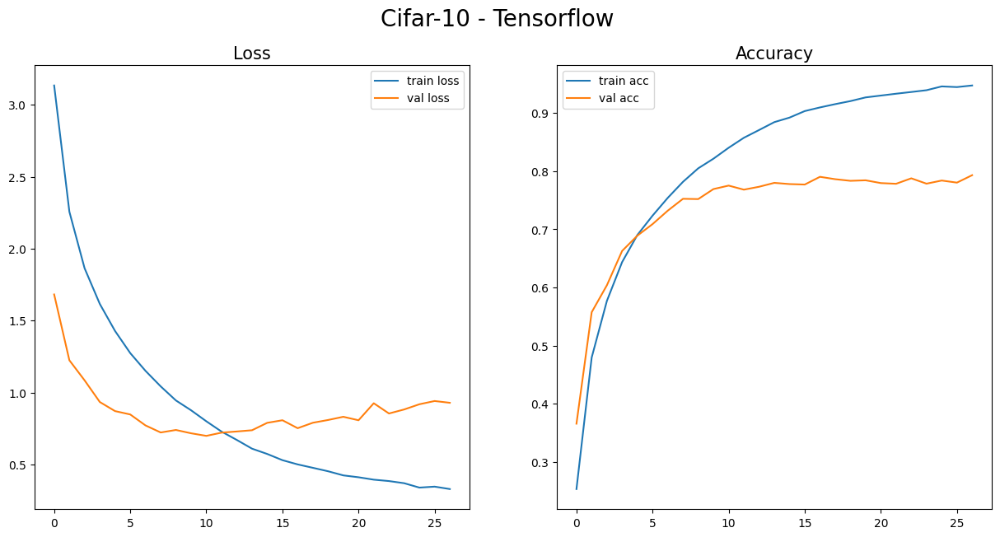

In [ ]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.plot(history.history['loss'],label='train loss')
plt.plot(history.history['val_output_loss'],label='val loss')
plt.legend()
plt.title('Loss',fontsize=15)

plt.subplot(1,2,2)
plt.plot(history.history['output_accuracy'],label='train acc')
plt.plot(history.history['val_output_accuracy'],label='val acc')
plt.legend()
plt.title('Accuracy',fontsize=15)

plt.suptitle('Cifar-10 - Tensorflow',fontsize=20)

모델 테스트 - 이미지 파일 예측

In [ ]:
# 훈련하지 않고 저장된 모델 파일 가져오기
!gdown 1tHoqjg5xsoT5xELXoWkWs-Gtm-xcT8fZ
!unzip googlenet-models.zip -d googlenet-models

In [ ]:
model = tf.keras.Model(input_layer, [x, x1, x2], name='GoogLeNet')
model.load_weights(tf.train.latest_checkpoint('./googlenet-models'))

In [ ]:
class_name = ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']
def convert_tf_cifar10_image_tensor(filename,temp_size=(16,16),target_size=(224,224)):
    file_contents = tf.io.read_file(filename)
    z = tf.image.decode_image(file_contents)
    z = tf.image.convert_image_dtype(z, tf.float32)  # uint8 --> float32([0,1]사이값)
    if temp_size:
        z = tf.image.resize(z,temp_size)
    z = tf.image.resize(z,target_size)
    return z

1/1 [==============================] - 0s 61ms/step


Text(0.5, 1.0, 'dog')

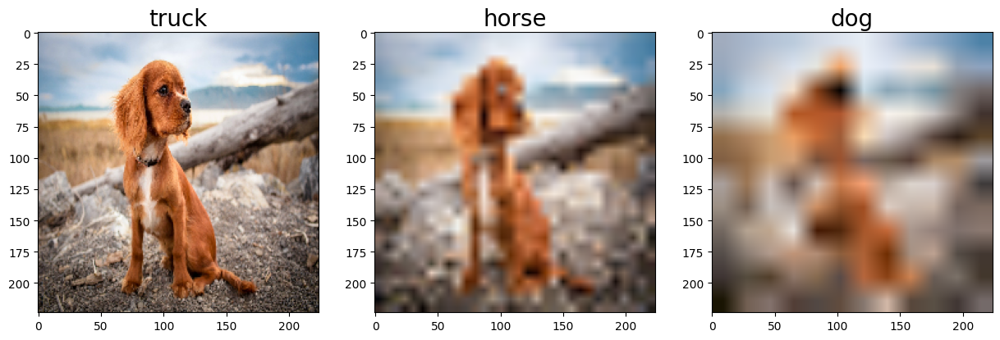

In [ ]:
filename = 'dog.jpg'  # dog.jpg  dog2.jpg   cifar-dog.jpg
target_size = (224,224)
plt.figure(figsize=(15,5))
# Try 1
z = convert_tf_cifar10_image_tensor(filename,temp_size=None,target_size=target_size)
index = model.predict(z[None])[0].argmax(-1)[0]
plt.subplot(1,3,1)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

# Try 2 (32,32) -> (224,224)
z = convert_tf_cifar10_image_tensor(filename,temp_size=(32,32),target_size=target_size)
index = model.predict(z[None])[0].argmax(-1)[0]
plt.subplot(1,3,2)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

# Try 3 (12,12) -> (224,224)
z = convert_tf_cifar10_image_tensor(filename,temp_size=(12,12),target_size=target_size)
index = model.predict(z[None])[0].argmax(-1)[0]
plt.subplot(1,3,3)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

In [ ]:
model.predict(z[None])[0]

array([[6.9562613e-11, 1.2164580e-12, 8.7102831e-05, 1.4092431e-04,
        2.1196432e-07, 7.0402819e-01, 1.2767890e-08, 2.9571900e-01,
        9.5042871e-12, 2.4523353e-05]], dtype=float32)

Text(0.5, 1.0, 'cifar-224x224')

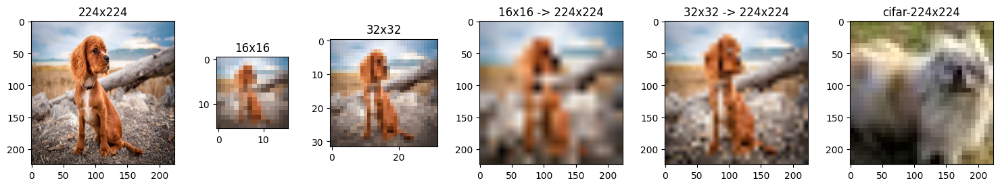

In [ ]:
fig, ax = plt.subplots(1, 6, gridspec_kw={'width_ratios': [2,1,1.5,2,2,2]},figsize=(15,5))
fig.tight_layout()

img = image.load_img('dog.jpg',target_size=(224,224)) # PIL Image
ax[0].imshow(img)
ax[0].set_title('224x224')


img_resize = img.resize((16,16))
ax[1].imshow(img_resize)
ax[1].set_title('16x16')

img_resize = img.resize((32,32))
ax[2].imshow(img_resize)
ax[2].set_title('32x32')

img_resize = convert_tf_cifar10_image_tensor('dog.jpg',(16,16))
ax[3].imshow(img_resize)
ax[3].set_title('16x16 -> 224x224')

img_resize = convert_tf_cifar10_image_tensor('dog.jpg',(32,32))
ax[4].imshow(img_resize)
ax[4].set_title('32x32 -> 224x224')


img = image.load_img('cifar-dog.jpg',target_size=(224,224)) # PIL Image
ax[5].imshow(img)
ax[5].set_title('cifar-224x224')

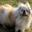

In [ ]:
image.load_img('cifar-dog.jpg')

## 7.3.5 Global Average Pooling


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D,MaxPool2D,Concatenate,AveragePooling2D,Flatten,Dense,Dropout,GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.preprocessing import image
import math
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os,time
import random

In [ ]:
n_class = 10
input_layer = tf.keras.Input(shape=(None, None, 3))

x = Conv2D(64, (7, 7), padding='same', strides=(2, 2), activation='relu', name='conv_1_7x7/2')(input_layer)
x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_1_3x3/2')(x)

x = Conv2D(64, (1, 1), padding='same', strides=(1, 1), activation='relu', name='conv_2a_3x3/1')(x)
x = Conv2D(192, (3, 3), padding='same', strides=(1, 1), activation='relu', name='conv_2b_3x3/1')(x)
x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_2_3x3/2')(x)

inception_3a_f = [64,96,128,16,32,32]
x = inception_module(x,inception_3a_f,name='inception_3a')

inception_3b_f = [128,128,192,32,96,64]
x = inception_module(x,inception_3b_f,name='inception_3b')

x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_3_3x3/2')(x)

inception_4_f = [[192,96,208,16,48,64],[160,112,224,24,64,64],[128,128,256,24,64,64],[112,144,288,32,64,64],[256,160,320,32,128,128]]

temp = []
for i in range(5):
    x = inception_module(x,inception_4_f[i],name=f'inception_4_{i}')
    temp.append(x)

# Auxiliary Classifier - 1
x1 = GlobalAveragePooling2D()(temp[0])
x1 = Dense(128, activation='relu')(x1)
x1 = Dense(1024, activation='relu')(x1)
x1 = Dropout(0.7)(x1)
x1 = Dense(n_class, activation='softmax', name='auxilliary_classifier_1')(x1)

# Auxiliary Classifier - 2
x2 = GlobalAveragePooling2D()(temp[3])
x2 = Dense(128, activation='relu')(x2)
x2 = Dense(1024, activation='relu')(x2)
x2 = Dropout(0.7)(x2)
x2 = Dense(n_class, activation='softmax', name='auxilliary_classifier_2')(x2)


x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_4_3x3/2')(x)  # x = temp[-1]

inception_5a_f = [256,160,320,32,128,128]
x = inception_module(x,inception_5a_f,name='inception_5a')

inception_5b_f = [384,192,384,48,128,128]
x = inception_module(x,inception_5b_f,name='inception_5b')

x = GlobalAveragePooling2D()(x)
x = Dropout(0.4)(x)

x = Dense(n_class, activation='softmax', name='output')(x)

model_gap = tf.keras.Model(input_layer, [x, x1, x2], name='GoogLeNet')  # GoogLeNet  inception_v1   --->  Trainable params: 6,401,870

In [ ]:
x = np.random.rand(2,224,224,3)
print(model_gap(x)[0].shape)

x = np.random.rand(2,32,32,3)
print(model_gap(x)[0].shape)


(2, 10)
(2, 10)


## 7.3.6 사용자 정의 Callback

In [ ]:
initial_learning_rate = 0.001
batch_size = 64  # colab에서 128이면 Error
monitor_name = 'val_output_accuracy'  # 이 모델에서는 'val_accuracy'로 하면 안된다.

# learning rate callback
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
                            monitor=monitor_name,  # val loss를 기준으로...
                            factor=0.6,          # callback 호출시 lr = factor*lr
                            patience=10,         # patience epoch동안 monitor값이 좋아지지 않으면 callback 작동
                            cooldown=0,         # lr이 변경된 후, cooldonw동안에는 callback이 작동 안 한다.
                            min_lr=0.0001,
                            verbose = 1,min_delta=0.001)

# early stop callback
es_callback = tf.keras.callbacks.EarlyStopping(
                            monitor=monitor_name,
                            min_delta=0.003,  # 이 값 이상으로 변화되어야 향상으로 인정.
                            patience=10,
                            verbose=1,
                            mode="auto",
                            baseline=None,
                            restore_best_weights=True,  # stop될때 마지막이 아닌, best weight로 복원
                        )

optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)  # lr or learning_rate
#optimizer = tf.keras.optimizers.SGD(learning_rate=initial_learning_rate, momentum=0.9, nesterov=False)

# checkpoint callback
model_filename = "Epoch-{epoch:03d}-{val_output_accuracy:.4f}"   # val_output_accuracy(이름이 중요)
checkpoint_path = os.path.join('./googlenet-models/', model_filename)

cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1,mode='auto',save_best_only=True,monitor=monitor_name)

model_gap.compile(loss=['sparse_categorical_crossentropy', 'sparse_categorical_crossentropy', 'sparse_categorical_crossentropy'],
            loss_weights=[1, 0.3, 0.3], optimizer=optimizer, metrics=['accuracy'])

class MyCallback(tf.keras.callbacks.Callback):
    def __init__(self,monitor):
        super(MyCallback, self).__init__()
        self.monitor = monitor
    def on_train_begin(self, logs={}):
        self.times = []
        self.s_time=time.time()
        self.best_duration = 0
        self.best_val_acc = -99.

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.s_time)

        if self.best_val_acc < logs[self.monitor]:
            self.best_val_acc = logs[self.monitor]
            self.best_duration = 0
            print(f'best val acc: {self.best_val_acc:.4f}, ====== new best====== elapsed: {time.time()-self.epoch_time_start:.2f}-{self.times[-1]:.2f}sec')
        else:
            self.best_duration += 1
            print(f'best val acc: {self.best_val_acc:.4f}, best duration: {self.best_duration}, elapsed: {time.time()-self.epoch_time_start:.2f}-{self.times[-1]:.2f}sec')
mycallback = MyCallback('val_output_accuracy')

### 모델 훈련: (224,224) + Global Average Pooling

In [ ]:
print(f'initial lr: {initial_learning_rate}')
history = model_gap.fit(train_dataset,epochs=400,validation_data=valid_dataset,validation_freq=1, verbose=1,
                   callbacks=[es_callback,cp_callback,lr_callback,mycallback],initial_epoch=0)

initial lr: 0.001
Epoch 1/400
782/782 [==============================] - ETA: 0s - loss: 3.6856 - output_loss: 2.3038 - auxilliary_classifier_1_loss: 2.3028 - auxilliary_classifier_2_loss: 2.3032 - output_accuracy: 0.0985 - auxilliary_classifier_1_accuracy: 0.1030 - auxilliary_classifier_2_accuracy: 0.0993
Epoch 1: val_output_accuracy improved from -inf to 0.10000, saving model to ./models/Epoch-001-0.1000
best val acc: 0.1000, ====== new best====== elapsed: 210.08sec
782/782 [==============================] - 207s 230ms/step - loss: 3.6856 - output_loss: 2.3038 - auxilliary_classifier_1_loss: 2.3028 - auxilliary_classifier_2_loss: 2.3032 - output_accuracy: 0.0985 - auxilliary_classifier_1_accuracy: 0.1030 - auxilliary_classifier_2_accuracy: 0.0993 - val_loss: 3.6876 - val_output_loss: 2.3060 - val_auxilliary_classifier_1_loss: 2.3025 - val_auxilliary_classifier_2_loss: 2.3028 - val_output_accuracy: 0.1000 - val_auxilliary_classifier_1_accuracy: 0.1000 - val_auxilliary_classifier_2_acc

모델 테스트 - 이미지 파일 예측

In [ ]:
# 훈련하지 않고 저장된 모델 파일 가져오기
!gdown 1LE1eSluP1ouJbaXU1VMheGgEavPsApzl
!unzip googlenet-models-gap.zip -d googlenet-models-gap

Downloading...
From: https://drive.google.com/uc?id=1LE1eSluP1ouJbaXU1VMheGgEavPsApzl
To: /content/googlenet-models-gap.zip
100% 63.9M/63.9M [00:03<00:00, 19.9MB/s]
Archive:  googlenet-models-gap.zip
  inflating: googlenet-models-gap/checkpoint  
  inflating: googlenet-models-gap/Epoch-039-0.7945.data-00000-of-00001  
  inflating: googlenet-models-gap/Epoch-039-0.7945.index  


In [ ]:
model_gap.load_weights(tf.train.latest_checkpoint('./googlenet-models-gap'))

1/1 [==============================] - 0s 206ms/step


Text(0.5, 1.0, 'dog')

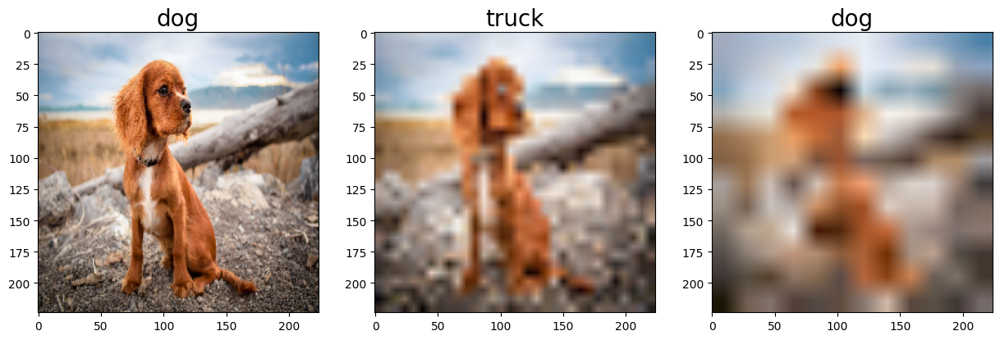

In [ ]:
filename = 'dog.jpg'  # dog.jpg  dog21.jpg   cifar-dog.jpg
target_size = (224,224)
plt.figure(figsize=(15,5))
# Try 1
z = convert_tf_cifar10_image_tensor(filename,temp_size=None,target_size=target_size)  # convert_tf_cifar10_image_tensor() "7.3.4"에 정의되어 있다.
index = model_gap.predict(z[None])[0].argmax(-1)[0]
plt.subplot(1,3,1)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

# Try 2 (32,32) -> (224,224)
z = convert_tf_cifar10_image_tensor(filename,temp_size=(32,32),target_size=target_size)
index = model_gap.predict(z[None])[0].argmax(-1)[0]
plt.subplot(1,3,2)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

# Try 3 (16,16) -> (224,224)
z = convert_tf_cifar10_image_tensor(filename,temp_size=(12,12),target_size=target_size)
index = model_gap.predict(z[None])[0].argmax(-1)[0]
plt.subplot(1,3,3)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

### 모델 훈련: (32,32) + Global Average Pooling
- 앞에서 (32,32) 크기의 cifar 이미지를 (224,224)로 resize하여 모델에 넣었다.
- 이번에는 모델의 입력 크기를 (32,32)로 모델을 수정하고 cifar 이미지를 그대로 넣어서 훈련한다.
- 모델 구조는 model_gap와 동일하다. Dataset만 (32,32)로 만들어주면 된다.
- 훈련해 보면 앞선 모델보다 결과가 좋지 않다.

In [ ]:
# modle_gap과 같은 구조. 입력 데이터의 크기만 224 --> 32로 하여 train
model_gap_32 = tf.keras.Model(input_layer, [x, x1, x2], name='GoogLeNet')  # GoogLeNet  inception_v1   --->  Trainable params: 6,401,870

In [ ]:
initial_learning_rate = 0.001
batch_size = 64  # colab에서 128이면 Error
monitor_name = 'val_output_accuracy'  # 이 모델에서는 'val_accuracy'로 하면 안된다.

# learning rate callback
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
                            monitor=monitor_name,  # val loss를 기준으로...
                            factor=0.6,          # callback 호출시 lr = factor*lr
                            patience=10,         # patience epoch동안 monitor값이 좋아지지 않으면 callback 작동
                            cooldown=0,         # lr이 변경된 후, cooldonw동안에는 callback이 작동 안 한다.
                            min_lr=0.0001,
                            verbose = 1,min_delta=0.001)

# early stop callback
es_callback = tf.keras.callbacks.EarlyStopping(
                            monitor=monitor_name,
                            min_delta=0.003,  # 이 값 이상으로 변화되어야 향상으로 인정.
                            patience=10,
                            verbose=1,
                            mode="auto",
                            baseline=None,
                            restore_best_weights=True,  # stop될때 마지막이 아닌, best weight로 복원
                        )

optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)  # lr or learning_rate
#optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=initial_learning_rate)
#optimizer = tf.keras.optimizers.SGD(learning_rate=initial_learning_rate, momentum=0.9, nesterov=False)

# checkpoint callback
model_filename = "Epoch-{epoch:03d}-{val_output_accuracy:.4f}"   # val_output_accuracy(이름이 중요)
checkpoint_path = os.path.join('./googlenet-models-gap-32x32/', model_filename)

cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1,mode='auto',save_best_only=True,monitor=monitor_name)

model_gap_32.compile(loss=['sparse_categorical_crossentropy', 'sparse_categorical_crossentropy', 'sparse_categorical_crossentropy'],
            loss_weights=[1, 0.3, 0.3], optimizer=optimizer, metrics=['accuracy'])


class MyCallback(tf.keras.callbacks.Callback):
    def __init__(self,monitor):
        super(MyCallback, self).__init__()
        self.monitor = monitor
    def on_train_begin(self, logs={}):
        self.times = []
        self.s_time=time.time()
        self.best_duration = 0
        self.best_val_acc = -99.

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.s_time)

        if self.best_val_acc < logs[self.monitor]:
            self.best_val_acc = logs[self.monitor]
            self.best_duration = 0
            print(f'best val acc: {self.best_val_acc:.4f}, ====== new best====== elapsed: {time.time()-self.epoch_time_start:.2f}-{self.times[-1]:.2f}sec')
        else:
            self.best_duration += 1
            print(f'best val acc: {self.best_val_acc:.4f}, best duration: {self.best_duration}, elapsed: {time.time()-self.epoch_time_start:.2f}-{self.times[-1]:.2f}sec')
mycallback = MyCallback('val_output_accuracy')

In [ ]:
batch_size = 64
num_classes = 10
img_size = (32,32)
(X_train, Y_train), (X_valid, Y_valid) = tf.keras.datasets.cifar10.load_data()
# X_train = X_train[:1000];Y_train = Y_train[:1000];X_valid = X_valid[:1000];Y_valid = Y_valid[:1000]
train_dataset = tf.data.Dataset.from_tensor_slices(((X_train/255.).astype(np.float32),Y_train.reshape(-1))).shuffle(buffer_size=10000).batch(batch_size)
train_dataset = train_dataset.map(lambda x,y: preprocessing(x,img_size,y,num_classes)).prefetch(128)

valid_dataset = tf.data.Dataset.from_tensor_slices(((X_valid/255.).astype(np.float32),Y_valid.reshape(-1))).batch(batch_size)
valid_dataset = valid_dataset.map(lambda x,y: preprocessing(x,img_size,y,num_classes)).prefetch(128)

In [ ]:
print(f'initial lr: {initial_learning_rate}')
history = model_gap_32.fit(train_dataset,epochs=400,validation_data=valid_dataset,validation_freq=1, verbose=1,
                   callbacks=[es_callback,cp_callback,lr_callback,mycallback],initial_epoch=0)

initial lr: 0.001
Epoch 1/400
782/782 [==============================] - ETA: 0s - loss: 3.2205 - output_loss: 2.0165 - auxilliary_classifier_1_loss: 1.9915 - auxilliary_classifier_2_loss: 2.0216 - output_accuracy: 0.1852 - auxilliary_classifier_1_accuracy: 0.2066 - auxilliary_classifier_2_accuracy: 0.1822
Epoch 1: val_output_accuracy improved from -inf to 0.22690, saving model to ./models/Epoch-001-0.2269
best val acc: 0.2269, ====== new best====== elapsed: 31.79sec
782/782 [==============================] - 31s 31ms/step - loss: 3.2205 - output_loss: 2.0165 - auxilliary_classifier_1_loss: 1.9915 - auxilliary_classifier_2_loss: 2.0216 - output_accuracy: 0.1852 - auxilliary_classifier_1_accuracy: 0.2066 - auxilliary_classifier_2_accuracy: 0.1822 - val_loss: 2.9684 - val_output_loss: 1.8746 - val_auxilliary_classifier_1_loss: 1.7845 - val_auxilliary_classifier_2_loss: 1.8616 - val_output_accuracy: 0.2269 - val_auxilliary_classifier_1_accuracy: 0.3059 - val_auxilliary_classifier_2_accura

In [ ]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.plot(history.history['loss'],label='train loss')
plt.plot(history.history['val_output_loss'],label='val loss')
plt.legend()
plt.title('Loss')

plt.subplot(1,2,2)
plt.plot(history.history['output_accuracy'],label='train acc')
plt.plot(history.history['val_output_accuracy'],label='val acc')
plt.legend()
plt.title('Accuracy')

plt.suptitle('GoogLeNet-gap-32 - Cifar-10 - Tensorflow',fontsize=20)

모델 테스트 - 이미지 파일 예측

In [ ]:
# 훈련하지 않고 저장된 모델 파일 가져오기
!gdown 1PpGg38m9031yiZUyjVIJIpvM9vguY32A
!unzip googlenet-models-gap-32x32.zip -d googlenet-models-gap-32x32

Downloading...
From: https://drive.google.com/uc?id=1PpGg38m9031yiZUyjVIJIpvM9vguY32A
To: /content/googlenet-models-gap-32x32.zip
100% 47.8M/47.8M [00:01<00:00, 35.5MB/s]
Archive:  googlenet-models-gap-32x32.zip
  inflating: googlenet-models-gap-32x32/checkpoint  
  inflating: googlenet-models-gap-32x32/Epoch-022-0.6617.data-00000-of-00001  
  inflating: googlenet-models-gap-32x32/Epoch-022-0.6617.index  


In [ ]:
model_gap_32 = tf.keras.Model(input_layer, [x, x1, x2], name='GoogLeNet')
model_gap_32.load_weights(tf.train.latest_checkpoint('./googlenet-models-gap-32x32'))

1/1 [==============================] - 0s 35ms/step


Text(0.5, 1.0, 'dog')

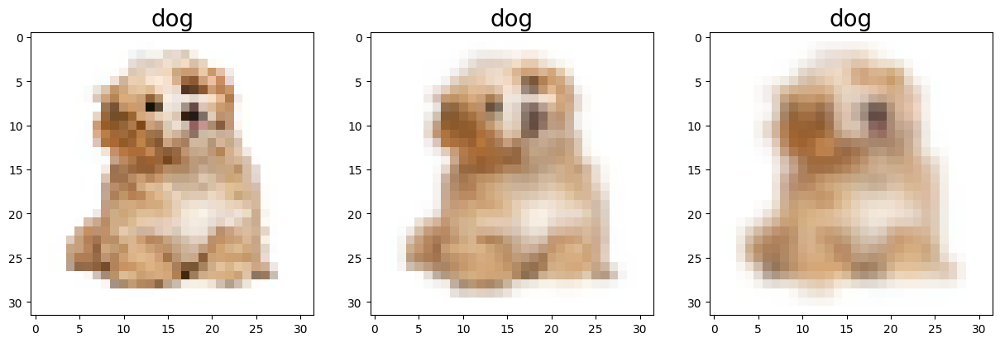

In [ ]:
filename = 'dogdog.jpg'  # cifar-dog.jpg, dogdog.jpg
target_size = (32,32)
plt.figure(figsize=(15,5))
# Try 1
z = convert_tf_cifar10_image_tensor(filename,temp_size=None,target_size=target_size)
index = model_gap_32.predict(z[None])[0].argmax(-1)[0]
plt.subplot(1,3,1)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

# Try 2 (24,24) -> (32,32)
z = convert_tf_cifar10_image_tensor(filename,temp_size=(24,24),target_size=target_size)
index = model_gap_32.predict(z[None])[0].argmax(-1)[0]
plt.subplot(1,3,2)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

# Try 3 (16,16) -> (32,32)
z = convert_tf_cifar10_image_tensor(filename,temp_size=(16,16),target_size=target_size)
index = model_gap_32.predict(z[None])[0].argmax(-1)[0]
plt.subplot(1,3,3)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

## 7.3.8 Resnet Tensorflow 구현

In [ ]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
import math
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os,time,re

In [ ]:
class BasicBlock(tf.keras.layers.Layer):
    def __init__(self, filter_num, strides=1):
        super(BasicBlock, self).__init__()
        self.conv1 = tf.keras.layers.Conv2D(filters=filter_num,kernel_size=(3, 3),strides=strides,padding="same",use_bias=False)
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.conv2 = tf.keras.layers.Conv2D(filters=filter_num,kernel_size=(3, 3),strides=1,padding="same",use_bias=False)
        self.bn2 = tf.keras.layers.BatchNormalization()
        if strides != 1:
            self.downsample = tf.keras.Sequential()
            self.downsample.add(tf.keras.layers.Conv2D(filters=filter_num,kernel_size=(1, 1),strides=strides,use_bias=False))
            self.downsample.add(tf.keras.layers.BatchNormalization())
        else:
            self.downsample = lambda x: x

    def call(self, inputs, training=None):
        residual = self.downsample(inputs)

        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv2(x)
        x = self.bn2(x, training=training)

        output = tf.nn.relu(tf.keras.layers.add([residual, x]))

        return output

def make_basic_layer(filter_num, n_layers, strides=1):
    # n_layers: BasicBlock을 몇개 만들 것인지 결정
    res_block = tf.keras.Sequential()
    res_block.add(BasicBlock(filter_num, strides=strides))

    for _ in range(1, n_layers):
        res_block.add(BasicBlock(filter_num, strides=1))

    return res_block

class ResNet_A(tf.keras.Model):
    def __init__(self, layer_params,NUM_CLASSES = 10):
        # resnet18: layer_params = [2,2,2,2]
        # resnet34: layer_params = [3,4,6,3]
        super(ResNet_A, self).__init__()
        kernel_init = tf.keras.initializers.glorot_uniform()
        bias_init = tf.keras.initializers.Constant(value=0.2)
        fiter_nums = [64,128,256,512]
        self.conv1 = tf.keras.layers.Conv2D(filters=64,kernel_size=(7, 7),strides=2,padding="same",use_bias=False,kernel_initializer=kernel_init)
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.pool1 = tf.keras.layers.MaxPool2D(pool_size=(3, 3),strides=2,padding="same")

        self.layer1 = make_basic_layer(filter_num=fiter_nums[0],n_layers=layer_params[0],strides=1)
        self.layer2 = make_basic_layer(filter_num=fiter_nums[1],n_layers=layer_params[1],strides=2)
        self.layer3 = make_basic_layer(filter_num=fiter_nums[2],n_layers=layer_params[2],strides=2)
        self.layer4 = make_basic_layer(filter_num=fiter_nums[3],n_layers=layer_params[3],strides=2)

        self.avgpool = tf.keras.layers.GlobalAveragePooling2D()
        self.fc = tf.keras.layers.Dense(units=NUM_CLASSES, activation=None,kernel_initializer=kernel_init,bias_initializer=bias_init)

    def call(self, inputs, training=None):
        x = self.conv1(inputs) # 1/2 size
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.pool1(x) # 1/2 size
        x = self.layer1(x, training=training)  # 크기 유지
        x = self.layer2(x, training=training)  # 1/2 size
        x = self.layer3(x, training=training)  # 1/2 size
        x = self.layer4(x, training=training)  # 1/2 size
        x = self.avgpool(x)
        output = self.fc(x)

        return output

def Resnet18(NUM_CLASSES):
    return ResNet_A(layer_params=[2, 2, 2, 2],NUM_CLASSES=NUM_CLASSES)
def Resnet34(NUM_CLASSES):
    return ResNet_A(layer_params=[3, 4, 6, 3],NUM_CLASSES=NUM_CLASSES)

In [ ]:
resnet18 = Resnet18(NUM_CLASSES=10)
resnet18.build((None,224,224,3))

resnet34 = Resnet34(NUM_CLASSES=10)
resnet34.build((None,224,224,3))

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089
/usr/local/lib/python3.8/dist-packages/keras/initializers/initializers_v2.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


In [ ]:
resnet18.summary()

Model: "res_net_a_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           multiple                  9408      
                                                                 
 batch_normalization_1 (Batc  multiple                 256       
 hNormalization)                                                 
                                                                 
 max_pooling2d_1 (MaxPooling  multiple                 0         
 2D)                                                             
                                                                 
 sequential_1 (Sequential)   (None, 56, 56, 64)        148480    
                                                                 
 sequential_2 (Sequential)   (None, 28, 28, 128)       526848    
                                                                 
 sequential_4 (Sequential)   (None, 14, 14, 256)       

In [ ]:
class BottleneckBlock(tf.keras.layers.Layer):
    def __init__(self, filter_num, strides=1,PS=False):
        # PS: Projection Shortcut
        super(BottleneckBlock, self).__init__()
        self.conv1 = tf.keras.layers.Conv2D(filters=filter_num,kernel_size=(1, 1),strides=1,padding='same',use_bias=False)
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.conv2 = tf.keras.layers.Conv2D(filters=filter_num,kernel_size=(3, 3),strides=strides,padding='same',use_bias=False)
        self.bn2 = tf.keras.layers.BatchNormalization()
        self.conv3 = tf.keras.layers.Conv2D(filters=filter_num * 4,kernel_size=(1, 1),strides=1,padding='same',use_bias=False)
        self.bn3 = tf.keras.layers.BatchNormalization()

        if strides==1 and not PS:
            self.downsample = lambda x: x
        else:
            self.downsample = tf.keras.Sequential()
            self.downsample.add(tf.keras.layers.Conv2D(filters=filter_num * 4,kernel_size=(1, 1),strides=strides,use_bias=False))
            self.downsample.add(tf.keras.layers.BatchNormalization())


    def call(self, inputs, training=None):
        residual = self.downsample(inputs)

        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv2(x)
        x = self.bn2(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv3(x)
        x = self.bn3(x, training=training)

        output = tf.nn.relu(tf.keras.layers.add([residual, x]))

        return output

def make_bottleneck_layer(filter_num, n_layers, strides=1):
    # n_layers: BottleneckBlock을 몇개 만들 것인지 결정
    res_block = tf.keras.Sequential()

    # conv2_1에서 strides=1이지만, max pooling에서 넘어온 channel 크기가 달라, projection shortcut이 필요하다. --> PS=True
    res_block.add(BottleneckBlock(filter_num, strides=strides,PS=True))

    for _ in range(1, n_layers):
        res_block.add(BottleneckBlock(filter_num, strides=1))
    return res_block

class ResNet_B(tf.keras.Model):
    def __init__(self, layer_params,NUM_CLASSES = 10):
        # resnet50: layer_params=[3, 4, 6, 3]
        # resnet101: layer_params=[3, 4, 23, 3]
        # resnet152: layer_params=[3, 8, 36, 3]
        super(ResNet_B, self).__init__()
        fiter_nums = [64,128,256,512]
        self.conv1 = tf.keras.layers.Conv2D(filters=64,kernel_size=(7, 7),strides=2,padding="same",use_bias=False)
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.pool1 = tf.keras.layers.MaxPool2D(pool_size=(3, 3),strides=2,padding="same")

        self.layer1 = make_bottleneck_layer(filter_num=fiter_nums[0],n_layers=layer_params[0],strides=1)
        self.layer2 = make_bottleneck_layer(filter_num=fiter_nums[1],n_layers=layer_params[1],strides=2)
        self.layer3 = make_bottleneck_layer(filter_num=fiter_nums[2],n_layers=layer_params[2],strides=2)
        self.layer4 = make_bottleneck_layer(filter_num=fiter_nums[3],n_layers=layer_params[3],strides=2)

        self.avgpool = tf.keras.layers.GlobalAveragePooling2D()
        self.fc = tf.keras.layers.Dense(units=NUM_CLASSES, activation=None)

    def call(self, inputs, training=None):
        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.pool1(x)
        x = self.layer1(x, training=training)
        x = self.layer2(x, training=training)
        x = self.layer3(x, training=training)
        x = self.layer4(x, training=training)
        x = self.avgpool(x)
        output = self.fc(x)

        return output

def Resnet50(NUM_CLASSES):
    return ResNet_B(layer_params=[3, 4, 6, 3],NUM_CLASSES=NUM_CLASSES)
def Resnet101(NUM_CLASSES):
    return ResNet_B(layer_params=[3, 4, 23, 3],NUM_CLASSES=NUM_CLASSES)
def Resnet152(NUM_CLASSES):
    return ResNet_B(layer_params=[3, 8, 36, 3],NUM_CLASSES=NUM_CLASSES)

In [ ]:
resnet50 = Resnet50(NUM_CLASSES=10)
resnet50.build((None,224,224,3))

In [ ]:
resnet50.summary()

Model: "res_net_b_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_58 (Conv2D)          multiple                  9408      
                                                                 
 batch_normalization_58 (Bat  multiple                 256       
 chNormalization)                                                
                                                                 
 max_pooling2d_4 (MaxPooling  multiple                 0         
 2D)                                                             
                                                                 
 sequential_15 (Sequential)  (None, 56, 56, 256)       218624    
                                                                 
 sequential_17 (Sequential)  (None, 28, 28, 512)       1226752   
                                                                 
 sequential_19 (Sequential)  (None, 14, 14, 1024)      

## 7.3.9 Resnet 모델 훈련
- val acc: 34 epoch, 84.61%

In [ ]:
resnet18 = Resnet18(NUM_CLASSES=10)
resnet18.build((None,224,224,3))

In [ ]:
initial_learning_rate = 0.1
monitor_name = 'val_accuracy'

# learning rate callback
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
                            monitor=monitor_name,  # val loss를 기준으로...
                            factor=0.6,          # callback 호출시 lr = factor*lr
                            patience=5,         # patience epoch동안 monitor값이 좋아지지 않으면 callback 작동
                            cooldown=0,         # lr이 변경된 후, cooldonw동안에는 callback이 작동 안 한다.
                            min_lr=0.00001,
                            verbose = 1,min_delta=0.001)

# early stop callback
es_callback = tf.keras.callbacks.EarlyStopping(
                            monitor=monitor_name,
                            min_delta=0.001,  # 이 값 이상으로 변화되어야 향상으로 인정.
                            patience=10,
                            verbose=1,
                            mode="auto",
                            baseline=None,
                            restore_best_weights=True)  # stop될때 마지막이 아닌, best weight로 복원


optimizer = tf.keras.optimizers.SGD(learning_rate=initial_learning_rate,momentum=0.9)  # lr or learning_rate

# checkpoint callback
model_filename = "Epoch-{epoch:03d}-{val_accuracy:.4f}"
checkpoint_path = os.path.join('./resnet18-models/', model_filename)

cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1,mode='auto',save_best_only=True,monitor=monitor_name)

loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
resnet18.compile(loss=loss_fn, optimizer=optimizer, metrics=['accuracy'])

In [ ]:
mycallback2 = MyCallback(monitor_name)

In [ ]:
def preprocessing(imgs,img_size,labels):
    imgs = tf.image.resize(imgs, img_size)
    return imgs,labels

batch_size = 64
img_size = (224,224)
(X_train, Y_train), (X_valid, Y_valid) = tf.keras.datasets.cifar10.load_data()
# X_train = X_train[:1000];Y_train = Y_train[:1000];X_valid = X_valid[:1000];Y_valid = Y_valid[:1000]
train_dataset = tf.data.Dataset.from_tensor_slices(((X_train/255.).astype(np.float32),Y_train.reshape(-1))).shuffle(buffer_size=10000).batch(batch_size)
train_dataset = train_dataset.map(lambda x,y: preprocessing(x,img_size,y)).prefetch(128)

valid_dataset = tf.data.Dataset.from_tensor_slices(((X_valid/255.).astype(np.float32),Y_valid.reshape(-1))).batch(batch_size)
valid_dataset = valid_dataset.map(lambda x,y: preprocessing(x,img_size,y)).prefetch(128)

170508288/170498071 [==============================] - 4s 0us/step


In [ ]:
print(f'initial lr: {initial_learning_rate}')
history = resnet18.fit(train_dataset,epochs=400,validation_data=valid_dataset,validation_freq=1, verbose=1,
                   callbacks=[es_callback,cp_callback,lr_callback,mycallback2],initial_epoch=0)

initial lr: 0.1
Epoch 1/400
782/782 [==============================] - ETA: 0s - loss: 1.8779 - accuracy: 0.3453
Epoch 1: val_accuracy improved from -inf to 0.40220, saving model to ./resnet18-models/Epoch-001-0.4022
best val acc: 0.4022, ====== new best====== elapsed: 173.22-173.88sec
782/782 [==============================] - 173s 204ms/step - loss: 1.8779 - accuracy: 0.3453 - val_loss: 1.6400 - val_accuracy: 0.4022 - lr: 0.1000
Epoch 2/400
782/782 [==============================] - ETA: 0s - loss: 1.3200 - accuracy: 0.5172
Epoch 2: val_accuracy improved from 0.40220 to 0.43840, saving model to ./resnet18-models/Epoch-002-0.4384
best val acc: 0.4384, ====== new best====== elapsed: 160.20-364.44sec
782/782 [==============================] - 160s 205ms/step - loss: 1.3200 - accuracy: 0.5172 - val_loss: 1.6174 - val_accuracy: 0.4384 - lr: 0.1000
Epoch 3/400
782/782 [==============================] - ETA: 0s - loss: 1.0553 - accuracy: 0.6225
Epoch 3: val_accuracy improved from 0.43840 to

Text(0.5, 0.98, 'Cifar-10 - Tensorflow')

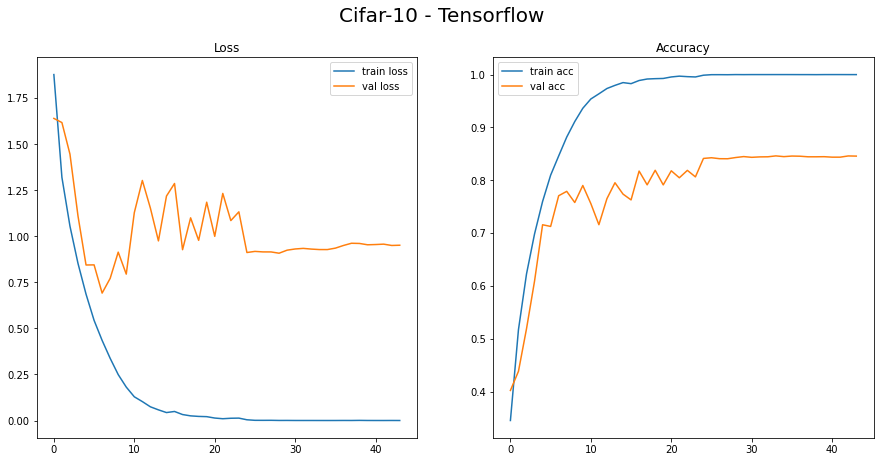

In [ ]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.plot(history.history['loss'],label='train loss')
plt.plot(history.history['val_loss'],label='val loss')
plt.legend()
plt.title('Loss')

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'],label='train acc')
plt.plot(history.history['val_accuracy'],label='val acc')
plt.legend()
plt.title('Accuracy')

plt.suptitle('Resnet - Cifar-10 - Tensorflow',fontsize=20)

모델 테스트 - 이미지 파일 예측

In [ ]:
# 훈련하지 않고 저장된 모델 파일 가져오기
!gdown 198v9fTC1saKxIy0SDjM1-xwsSXwox5ls
!unzip resnet18-models.zip -d resnet18-models

Downloading...
From: https://drive.google.com/uc?id=198v9fTC1saKxIy0SDjM1-xwsSXwox5ls
To: /content/resnet18-models.zip
100% 83.4M/83.4M [00:02<00:00, 29.7MB/s]
Archive:  resnet18-models.zip
  inflating: resnet18-models/checkpoint  
  inflating: resnet18-models/Epoch-034-0.8461.data-00000-of-00001  
  inflating: resnet18-models/Epoch-034-0.8461.index  


In [ ]:
resnet18 = Resnet18(NUM_CLASSES=10)

In [ ]:
resnet18.load_weights(tf.train.latest_checkpoint('./resnet18-models'))

1/1 [==============================] - 0s 178ms/step


Text(0.5, 1.0, 'dog')

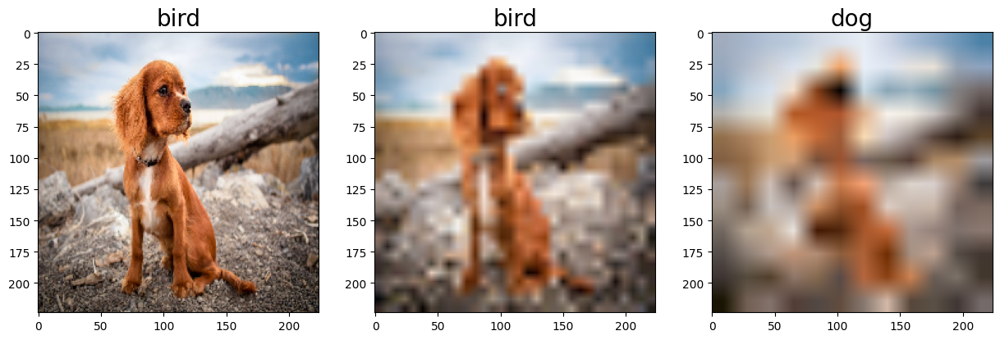

In [ ]:
filename = 'dog.jpg'  # cifar-dog.jpg
target_size = (224,224)
plt.figure(figsize=(15,5))
# Try 1
z = convert_tf_cifar10_image_tensor(filename,temp_size=None,target_size=target_size)
index = resnet18.predict(z[None]).argmax(-1)[0]
plt.subplot(1,3,1)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

# Try 2 (32,32) -> target_size
z = convert_tf_cifar10_image_tensor(filename,temp_size=(32,32),target_size=target_size)
index = resnet18.predict(z[None]).argmax(-1)[0]
plt.subplot(1,3,2)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

# Try 3 (12,12) -> target_size
z = convert_tf_cifar10_image_tensor(filename,temp_size=(12,12),target_size=target_size)
index = resnet18.predict(z[None]).argmax(-1)[0]
plt.subplot(1,3,3)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

## 7.3.10 Resnet & Data Augmentation

In [ ]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
import math
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os,time

from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
batch_size = 64  # colab에서 128이면 Error

print('Data from  ImageDataGenerator')
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()  # numpy array
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)  # (50000, 32, 32, 3) (50000, 1) (10000, 32, 32, 3) (10000, 1)

train_datagen = ImageDataGenerator(rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    preprocessing_function=None,
    )
train_dataset = train_datagen.flow(x_train, y_train.reshape(-1), batch_size=batch_size,shuffle=True)

valid_datagen = ImageDataGenerator(rescale=1./255)
valid_dataset = valid_datagen.flow(x_test, y_test.reshape(-1), batch_size=batch_size)

Data from  ImageDataGenerator
(50000, 32, 32, 3) (50000, 1) (10000, 32, 32, 3) (10000, 1)


In [ ]:
resnet18_aug = tf.keras.Sequential([tf.keras.layers.experimental.preprocessing.Resizing(224,224),Resnet18(NUM_CLASSES=10)])

In [ ]:
initial_learning_rate = 0.1

monitor_name = 'val_accuracy'

# learning rate callback
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
                            monitor=monitor_name,  # val loss를 기준으로...
                            factor=0.6,          # callback 호출시 lr = factor*lr
                            patience=5,         # patience epoch동안 monitor값이 좋아지지 않으면 callback 작동
                            cooldown=0,         # lr이 변경된 후, cooldonw동안에는 callback이 작동 안 한다.
                            min_lr=0.00001,
                            verbose = 1,min_delta=0.001)

# early stop callback
es_callback = tf.keras.callbacks.EarlyStopping(
                            monitor=monitor_name,
                            min_delta=0.001,  # 이 값 이상으로 변화되어야 향상으로 인정.
                            patience=10,
                            verbose=1,
                            mode="auto",
                            baseline=None,
                            restore_best_weights=True)  # stop될때 마지막이 아닌, best weight로 복원


optimizer = tf.keras.optimizers.SGD(learning_rate=initial_learning_rate,momentum=0.9)  # lr or learning_rate

# checkpoint callback
model_filename = "Epoch-{epoch:03d}-{val_accuracy:.4f}"
checkpoint_path = os.path.join('./resnet18-models-aug/', model_filename)

cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1,mode='auto',save_best_only=True,monitor=monitor_name)
mycallback2 = MyCallback(monitor_name)

loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
resnet18_aug.compile(loss=loss_fn, optimizer=optimizer, metrics=['accuracy'])

In [ ]:
print(f'initial lr: {initial_learning_rate}')
history = resnet18_aug.fit(train_dataset,epochs=200,validation_data=valid_dataset,validation_freq=1, verbose=1,
                   callbacks=[es_callback,cp_callback,lr_callback,mycallback2],initial_epoch=0)

initial lr: 0.1
Epoch 1/200
782/782 [==============================] - 85s 106ms/step - loss: 2.3031 - accuracy: 0.2729 - val_loss: 1.5471 - val_accuracy: 0.4238

Epoch 00001: val_accuracy improved from -inf to 0.42380, saving model to ./resnet18-models-aug\Epoch-001-0.4238
best val acc: 0.4238, ====== new best====== elapsed: 86.86-86.88sec
Epoch 2/200
782/782 [==============================] - 83s 106ms/step - loss: 1.4379 - accuracy: 0.4714 - val_loss: 1.2178 - val_accuracy: 0.5600ura - ETA: 0s - loss: 1.4382 - accuracy: 0. - ETA: 0s - loss: 1.4380 - accuracy: 0.47

Epoch 00002: val_accuracy improved from 0.42380 to 0.56000, saving model to ./resnet18-models-aug\Epoch-002-0.5600
best val acc: 0.5600, ====== new best====== elapsed: 84.95-171.84sec
Epoch 3/200
782/782 [==============================] - 83s 106ms/step - loss: 1.1505 - accuracy: 0.5835 - val_loss: 1.0229 - val_accuracy: 0.6533ETA: 1:00 - loss:  - ETA: 58s - loss: 1.1968 - acc - E - ETA: 52s - loss: 1.192 - ETA: 50s - los

Text(0.5, 0.98, 'Cifar-10 - Resnet18 - Data Augmentation')

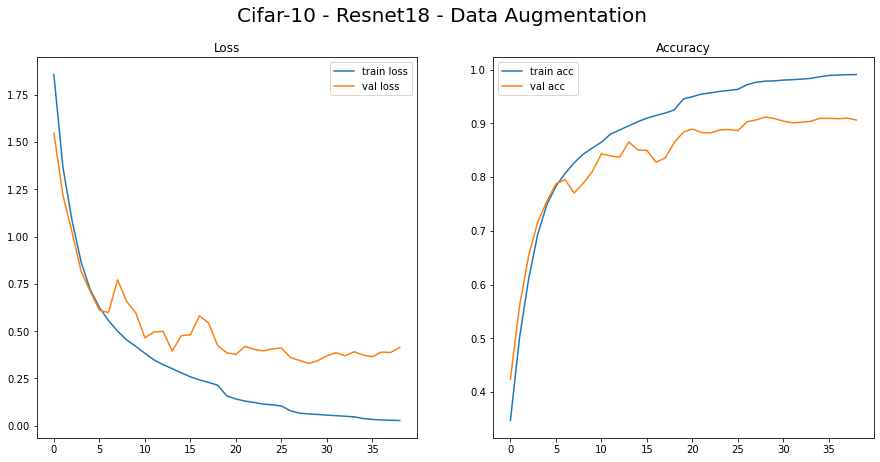

In [ ]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.plot(history.history['loss'],label='train loss')
plt.plot(history.history['val_loss'],label='val loss')
plt.legend()
plt.title('Loss')

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'],label='train acc')
plt.plot(history.history['val_accuracy'],label='val acc')
plt.legend()
plt.title('Accuracy')

plt.suptitle('Cifar-10 - Resnet18 - Data Augmentation',fontsize=20)

In [ ]:
# 이어서 train하기
initial_learning_rate = 0.004665600042790174

monitor_name = 'val_accuracy'

# learning rate callback
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
                            monitor=monitor_name,  # val loss를 기준으로...
                            factor=0.6,          # callback 호출시 lr = factor*lr
                            patience=5,         # patience epoch동안 monitor값이 좋아지지 않으면 callback 작동
                            cooldown=0,         # lr이 변경된 후, cooldonw동안에는 callback이 작동 안 한다.
                            min_lr=0.00001,
                            verbose = 1,min_delta=0.001)

# early stop callback
es_callback = tf.keras.callbacks.EarlyStopping(
                            monitor=monitor_name,
                            min_delta=0.001,  # 이 값 이상으로 변화되어야 향상으로 인정.
                            patience=10,
                            verbose=1,
                            mode="auto",
                            baseline=None,
                            restore_best_weights=True)  # stop될때 마지막이 아닌, best weight로 복원


optimizer = tf.keras.optimizers.SGD(learning_rate=initial_learning_rate,momentum=0.9)  # lr or learning_rate

# checkpoint callback
model_filename = "Epoch-{epoch:03d}-{val_accuracy:.4f}"
checkpoint_path = os.path.join('./resnet18-models-aug/', model_filename)

cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1,
                                                 mode='auto',save_best_only=True,monitor=monitor_name,
                                                 initial_value_threshold= 0.9174)

loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
resnet18_aug.compile(loss=loss_fn, optimizer=optimizer, metrics=['accuracy'])

last_checkpoint = tf.train.latest_checkpoint('./resnet18-models-aug')
resnet18_aug.load_weights(last_checkpoint)
initial_epoch = int(re.findall(r'-(\d+)-',last_checkpoint)[0]) # './resnet18-models-aug/Epoch-041-0.9174' --> 41
print(f'checkpoint: {last_checkpoint}')
print(f'initial_epoch: {initial_epoch}')

checkpoint: ./resnet18-models-aug/Epoch-041-0.9174
initial_epoch: 41


In [ ]:
print(f'initial lr: {initial_learning_rate}')
history = resnet18_aug.fit(train_dataset,epochs=200,validation_data=valid_dataset,validation_freq=1, verbose=1,
                   callbacks=[es_callback,cp_callback,lr_callback,mycallback2],initial_epoch=initial_epoch)

initial lr: 0.004665600042790174
Epoch 42/200
782/782 [==============================] - 86s 108ms/step - loss: 0.0355 - accuracy: 0.9885 - val_loss: 0.3272 - val_accuracy: 0.9164

Epoch 00042: val_accuracy improved from -inf to 0.91640, saving model to ./resnet18-models-aug\Epoch-042-0.9164
best val acc: 0.9164, ====== new best====== elapsed: 87.07-87.08sec
Epoch 43/200
782/782 [==============================] - 84s 107ms/step - loss: 0.0340 - accuracy: 0.9892 - val_loss: 0.3266 - val_accuracy: 0.9160

Epoch 00043: val_accuracy did not improve from 0.91640
best val acc: 0.9164, best duration: 1, elapsed: 84.00-171.10sec
Epoch 44/200
782/782 [==============================] - 84s 107ms/step - loss: 0.0315 - accuracy: 0.9904 - val_loss: 0.3240 - val_accuracy: 0.9170

Epoch 00044: val_accuracy improved from 0.91640 to 0.91700, saving model to ./resnet18-models-aug\Epoch-044-0.9170
best val acc: 0.9170, ====== new best====== elapsed: 85.69-256.80sec
Epoch 45/200
782/782 [=================

모델 테스트 - 이미지 파일 예측

In [ ]:
# 훈련하지 않고 저장된 모델 파일 가져오기
!gdown 1nTuAwWgpaC_WCZG39KE-Q9QqhZUX7Izg
!unzip resnet18-models-aug.zip -d resnet18-models-aug

Downloading...
From: https://drive.google.com/uc?id=1nTuAwWgpaC_WCZG39KE-Q9QqhZUX7Izg
To: /content/resnet18-models-aug.zip
100% 83.3M/83.3M [00:01<00:00, 43.8MB/s]
Archive:  resnet18-models-aug.zip
  inflating: resnet18-models-aug/checkpoint  
  inflating: resnet18-models-aug/Epoch-041-0.9174.data-00000-of-00001  
  inflating: resnet18-models-aug/Epoch-041-0.9174.index  


In [ ]:
resnet18_aug = tf.keras.Sequential([tf.keras.layers.experimental.preprocessing.Resizing(224,224),Resnet18(NUM_CLASSES=10)])
resnet18_aug.load_weights(tf.train.latest_checkpoint('./resnet18-models-aug'))

1/1 [==============================] - 0s 181ms/step


Text(0.5, 1.0, 'dog')

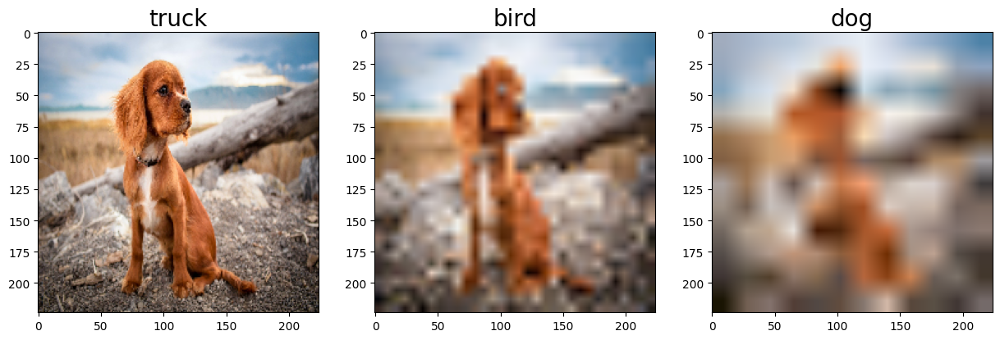

In [ ]:
filename = 'dog.jpg'  # cifar-dog.jpg, dog.jpg
target_size = (224,224)
plt.figure(figsize=(15,5))
# Try 1
z = convert_tf_cifar10_image_tensor(filename,temp_size=None,target_size=target_size)
index = resnet18_aug.predict(z[None]).argmax(-1)[0]
plt.subplot(1,3,1)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

# Try 2 (32,32) -> target_size
z = convert_tf_cifar10_image_tensor(filename,temp_size=(32,32),target_size=target_size)
index = resnet18_aug.predict(z[None]).argmax(-1)[0]
plt.subplot(1,3,2)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

# Try 3 (12,12) -> target_size
z = convert_tf_cifar10_image_tensor(filename,temp_size=(12,12),target_size=target_size)
index = resnet18_aug.predict(z[None]).argmax(-1)[0]
plt.subplot(1,3,3)
plt.imshow(z)
plt.title(class_name[index],fontsize=20)

In [ ]:
print(class_name)
resnet18_aug.predict(z[None])

['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


array([[-5.0809026 , -7.3400936 ,  0.9106926 ,  2.250681  ,  1.7315593 ,
        10.211522  , -5.4728856 ,  5.0979404 , -1.3276982 , -0.42675307]],
      dtype=float32)

# 7.4 Pre-trained Image Model

## 7.4.1 Tensorflow Pre-trained Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np

from tensorflow.keras.applications import inception_v3, resnet, vgg16, mobilenet_v2
import matplotlib.pyplot as plt

In [ ]:
def inception_preprocess(x):
    x = x/127.5 -1
    return x

img = image.load_img('dog.jpg',target_size=(224,224)) # PIL Image(Numpy로 변환하면 uint8[0-255])
img_processed = tf.keras.applications.inception_v3.preprocess_input(np.array(img))  # uint8 --> float32
img_processed2 = inception_preprocess(np.array(img).astype(np.float32))
img_processed3 = tf.keras.applications.mobilenet_v2.preprocess_input(np.array(img))  # uint8 --> float32

np.allclose(img_processed,img_processed2),np.allclose(img_processed2,img_processed3) # (True, True)

(True, True)

96112376/96112376 [==============================] - 1s 0us/step
preprocessed image shape:  (1, 299, 299, 3)
1/1 [==============================] - 2s 2s/step
model:  inception_v3
(1, 1000) [101]
35363/35363 [==============================] - 0s 0us/step
[[('n01871265', 'tusker', 0.46807274), ('n02504458', 'African_elephant', 0.40679783), ('n02504013', 'Indian_elephant', 0.04225375)]]


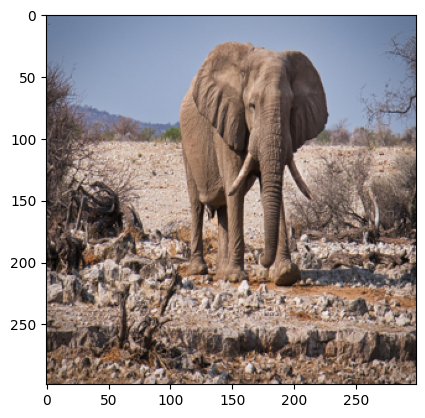

In [ ]:
def preprocess_image(image_path,base_model,image_size):
    # 이미지를 로드하고, 모델이 정한 크기의 numpy array 로 변환
    img = image.load_img(image_path).resize(image_size)   # PIL.JpegImagePlugin.JpegImageFile image

    processed_img = image.img_to_array(img)   # type은 float32 이지만, 값은 0~255값.
    processed_img = np.expand_dims(processed_img, axis=0)

    processed_img = base_model.preprocess_input(processed_img)  # 이미지  크기가 변하지 않는다.   ===> numpy array(tensor아님).
    return img,processed_img

model_name = {0: 'inception_v3', 1: 'resnet50', 2: 'vgg16', 3: 'mobilenet_v2'}

mode = 0
base_image_path = 'elephant.jpg'

if model_name[mode] == 'inception_v3':
    model = inception_v3.InceptionV3(weights='imagenet',include_top=True)
    base_model = inception_v3
    image_size = (299,299) # tuple(model.input.shape )[1:3]
elif model_name[mode] =='resnet50':
    model = resnet.ResNet50(weights='imagenet',include_top=True)
    base_model = resnet
    image_size = (224,224)
elif model_name[mode] == 'vgg16':
    model = vgg16.VGG16(weights='imagenet',include_top=True)
    base_model = vgg16
    image_size = (224,224)
elif model_name[mode] == 'mobilenet_v2':
    model = mobilenet_v2.MobileNetV2(weights='imagenet',include_top=True)
    base_model = mobilenet_v2
    image_size = (224,224)

img, processed_img = preprocess_image(base_image_path, base_model,image_size)  # numpy array로 변환
print('preprocessed image shape: ', processed_img.shape)

preds = model.predict(processed_img) # softmax를 거친 값(확률), numpy array
print('model: ',model_name[mode])
print(preds.shape, np.argmax(preds,axis=1))
print(base_model.decode_predictions(preds, top=3))  # preds로 부터 top 3를 추출해 준다.
plt.imshow(img)

In [ ]:
tf.keras.applications.imagenet_utils.decode_predictions(preds,top=3)

[[('n01871265', 'tusker', 0.46807274),
  ('n02504458', 'African_elephant', 0.40679783),
  ('n02504013', 'Indian_elephant', 0.04225375)]]

In [ ]:
type(preds)

numpy.ndarray

### Imagenet Class ID

In [ ]:
!wget https://github.com/Cadene/pretrained-models.pytorch/raw/master/data/imagenet_synsets.txt
!wget https://github.com/Cadene/pretrained-models.pytorch/raw/master/data/imagenet_classes.txt

--2023-08-11 05:15:11--  https://github.com/Cadene/pretrained-models.pytorch/raw/master/data/imagenet_synsets.txt
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Cadene/pretrained-models.pytorch/master/data/imagenet_synsets.txt [following]
--2023-08-11 05:15:11--  https://raw.githubusercontent.com/Cadene/pretrained-models.pytorch/master/data/imagenet_synsets.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 56691 (55K) [text/plain]
Saving to: ‘imagenet_synsets.txt’

imagenet_synsets.tx 100%[===================>]  55.36K  --.-KB/s    in 0.008s  

2023-08-11 05:15:11 (6.77 MB/s) - ‘imagenet_syns

In [ ]:
with open('imagenet_synsets.txt', 'r') as f:  # 1861개 line, head제외하면 1860개
    synsets = f.readlines()
synsets = [x.strip() for x in synsets]
splits = [line.split(' ') for line in synsets]
key_to_classname = {spl[0]:' '.join(spl[1:]) for spl in splits} # ---> {'n02119789': 'kit fox, Vulpes macrotis', 'n02100735': 'English setter', ... }


with open('imagenet_classes.txt', 'r') as f:  # imagenet 1000개 class
    class_id_to_key = f.readlines()

class_id_to_key = [x.strip() for x in class_id_to_key]  # ['n01440764', 'n01443537', 'n01484850', ...]
class_id_to_classname = [key_to_classname[x.strip()] for x in class_id_to_key]  # ['tench, Tinca tinca', 'goldfish, Carassius auratus', ...]

In [ ]:
class_id_to_classname[:10]

['tench, Tinca tinca',
 'goldfish, Carassius auratus',
 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 'tiger shark, Galeocerdo cuvieri',
 'hammerhead, hammerhead shark',
 'electric ray, crampfish, numbfish, torpedo',
 'stingray',
 'cock',
 'hen',
 'ostrich, Struthio camelus']

## 7.4.2 Pytorch Pre-trained Model
- windows default: ~\\.cache\\torch
- colab default: /root/.cache/torch

In [ ]:
import os
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
os.environ['TORCH_HOME'] = './pretrained'

Model: inception_v3
92.74%, 386, African elephant, Loxodonta africana
6.94%, 101, tusker
0.32%, 385, Indian elephant, Elephas maximus


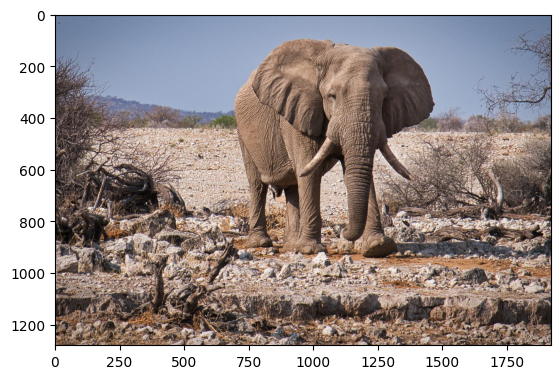

In [ ]:
model_name = {0: 'inception_v3', 1: 'resnet50', 2: 'vgg16', 3: 'mobilenet_v2'}
mode = 0
base_image_path = 'elephant.jpg'  # 'Indian_elephant.jpg'

if model_name[mode] == 'inception_v3':
    model = models.inception_v3(pretrained=True, progress=True)  # 100M
elif model_name[mode] =='resnet50':
    model = models.resnet50(pretrained=True, progress=True)  # 106M
elif model_name[mode] == 'vgg16':
    model = models.vgg16(pretrained=True, progress=True)  # 540M
elif model_name[mode] == 'mobilenet_v2':
    model = models.mobilenet_v2(pretrained=True, progress=True)  # 14M

transform = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),  #(H,W,C) --> (C,H,W)
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

img = Image.open(r'elephant.jpg')  # 'Indian_elephant.jpg'

processed_img = transform(img)  # torch.Size([3, 224, 224])   ---> eg. -1.91 ~ 2.36 사이 값
processed_img = torch.unsqueeze(processed_img,0)  # mini batch

model.eval()
logits = model(processed_img)  # ---> (N,1000)  ---> softmax 취하기 전.""
preds = torch.nn.functional.softmax(logits,dim=-1)
topk_probs, topk_ids = torch.topk(preds,3,dim=-1)  # top 3
topk_probs = topk_probs[0].detach().numpy() # tensor -> numpy array
topk_ids = topk_ids[0].detach().numpy() # tensor -> numpy array

plt.imshow(img)
print(f'Model: {model_name[mode]}')
for i in range(3):
    print(f'{topk_probs[i]:.2%}, {topk_ids[i]}, {class_id_to_classname[topk_ids[i]]}')

## 7.4.3 Adaptive Average Pooling
- https://discuss.pytorch.org/t/what-is-adaptiveavgpool2d/26897?u=ptrblck

In [ ]:
import torch
import numpy as np
import torchvision.models as models

In [ ]:
vgg16 = models.vgg16(pretrained=True, progress=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# 여기서 보여지는 모델 구조에는 Flatten이 보이지 않는다. 소스 코드를 확인해야 한다.
vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
def adaptive_average_pooling_1d(inputs, target_size):
    # inputs: pytorch Tensor (N,C,D)
    s = (torch.arange(target_size, dtype=torch.float32) * (inputs.size(-1) / target_size)).long()
    e = ((torch.arange(target_size, dtype=torch.float32)+1) * (inputs.size(-1) / target_size)).ceil().long()
    pooled = []
    for idx in range(target_size):
        pooled.append(torch.mean(inputs[:, :, s[idx]:e[idx]], dim=-1,keepdim=True))
    pooled = torch.cat(pooled, -1)
    return pooled

input_size = 7
target_size = 11

x = np.random.randn(2,3,input_size).astype(np.float32)  # (batch_size,num_channel,input_size)
x = torch.tensor(x)
y1 = adaptive_average_pooling_1d(x, target_size)

L = torch.nn.AdaptiveAvgPool1d(target_size)
y2 = L(x)

print(np.allclose(y1.numpy(),y2.numpy()))  # True

True


In [ ]:
y1.shape, y2.shape

(torch.Size([2, 3, 11]), torch.Size([2, 3, 11]))

## 7.4.4 Feature Extraction - Pytorch

In [ ]:
import torchvision.models as models
from torchvision.models.feature_extraction import get_graph_node_names
from torchvision.models.feature_extraction import create_feature_extractor
import torch

In [ ]:
model = models.resnet18(weights=None, progress=True)  # weights='ResNet18_Weights.DEFAULT'

# n_features = model.fc.in_features  # 512
# model.fc = torch.nn.Linear(n_features,12)

In [ ]:
# train_nodes: train mode에서 적용되는 layer
# eval_nodes: eval mode에서 적용되는 layer

train_nodes, eval_nodes = get_graph_node_names(model)

train_nodes, eval_nodes

In [ ]:
my_nodes = {
    'layer1': 'layer1zz',
    'layer4': 'layer4aa',
}
A = create_feature_extractor(model, return_nodes=my_nodes)

In [ ]:
x = torch.randn(2,3,224,224)
y = A(x)  # y: dict
for a in y.keys():
    print(a, y[a].shape)


layer1zz torch.Size([2, 64, 56, 56])
layer4aa torch.Size([2, 512, 7, 7])


# 7.5 Image Transfer Learning

## 7.5.2 Transfer Learning - Pytorch

In [ ]:
!wget https://download.pytorch.org/tutorial/hymenoptera_data.zip
!unzip hymenoptera_data.zip
!rm ./hymenoptera_data/train/ants/imageNotFound.gif  # 잘못된 파일 제거

In [ ]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

import torch.nn.functional as F
import torch.optim as optim
import time

In [ ]:
train_data_dir = './hymenoptera_data/train'
val_data_dir = './hymenoptera_data/val'

In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))  # (C,H,W) -> (H,W,C)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15,15))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
train_data_transforms = transforms.Compose([
    transforms.RandomResizedCrop(size=(256,256),scale=(0.7, 1.0),ratio=(0.9,1.1)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.CenterCrop(224),
    transforms.ToTensor(), #(H,W,C) --> (C,H,W)
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_data_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(), #(H,W,C) --> (C,H,W)
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset =  datasets.ImageFolder(train_data_dir, train_data_transforms)
val_dataset =  datasets.ImageFolder(val_data_dir, val_data_transforms)

class_names = train_dataset.classes
print(class_names)

['ants', 'bees']


In [ ]:
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=64,shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=8,shuffle=False)

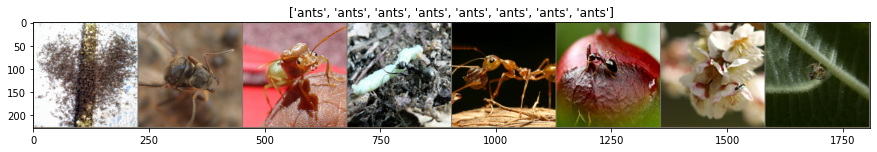

0 tensor([0, 0, 0, 0, 0, 0, 0, 0]) torch.Size([8, 3, 224, 224])


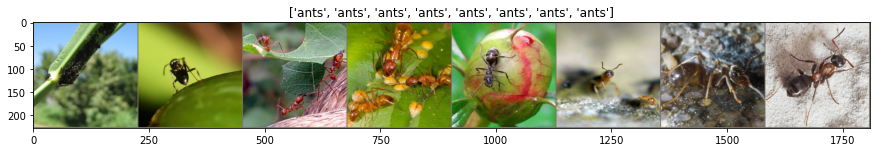

1 tensor([0, 0, 0, 0, 0, 0, 0, 0]) torch.Size([8, 3, 224, 224])


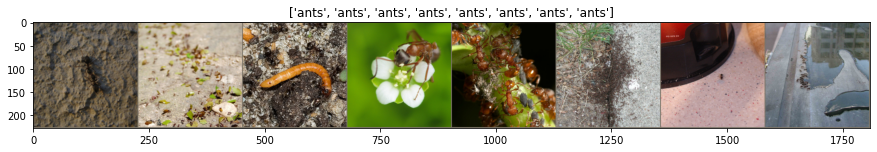

2 tensor([0, 0, 0, 0, 0, 0, 0, 0]) torch.Size([8, 3, 224, 224])


In [ ]:
#it = iter(train_dataloader)
it = iter(val_dataloader)
for i in range(3):
    inputs,classes = next(it)
    inputs = inputs[:8]; classes = classes[:8]
    out = torchvision.utils.make_grid(inputs)  # inputs: (8, 3, 150, 150)  ---> out: (3, 154, 1218)
    imshow(out, title=[class_names[x] for x in classes])
    print(i, classes, inputs.shape)

In [ ]:
transfer_flag = True
model = models.resnet18(pretrained=transfer_flag, progress=True)

In [ ]:
if transfer_flag:
    for layer_weight in model.parameters():
        layer_weight.requires_grad = False

n_features = model.fc.in_features  # 512
model.fc = torch.nn.Linear(n_features,2)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
model.to(device)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1,momentum=0.9, weight_decay=5e-4)

cuda:0


In [ ]:
num_epochs = 10
s_time = time.time()

train_loss_history = []; val_loss_history = []
train_acc_history = []; val_acc_history  = []

for epoch in range(num_epochs):  # loop for epoch
    running_loss = []
    acc = 0; total = 0
    model.train()
    for i, data in enumerate(train_dataloader):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        loss = loss_fn(outputs, labels)
        loss.backward()
        optimizer.step()

        _, pred = outputs.max(axis=-1)
        acc  += (pred==labels).float().sum().item()
        total += len(labels)

        running_loss.append(loss.item())
    train_loss_history.append(np.mean(running_loss))
    train_acc_history.append(acc/total)
    print('[epoch: %d] loss: %.3f, train acc: %.3f elapsed: %.2f' % (epoch + 1, np.mean(running_loss), acc/total , time.time()-s_time))

    # validation
    running_loss = []
    acc = 0; total = 0;
    model.eval()
    with torch.no_grad():
        for i, data in enumerate(val_dataloader):
            inputs, labels = data
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            loss = loss_fn(outputs, labels)

            _, pred = outputs.max(axis=-1)
            acc  += (pred==labels).float().sum().item()
            total += len(labels)
            running_loss.append(loss.item())

    val_loss_history.append(np.mean(running_loss))
    val_acc_history.append(acc/total)
    print('val loss: %.3f, val acc: %.3f' % (np.mean(running_loss), acc/total))

print('Finished Training')

[epoch: 1] loss: 3.393, train acc: 0.520 elapsed: 3.94
val loss: 605.253, val acc: 0.458
[epoch: 2] loss: 3.342, train acc: 0.545 elapsed: 10.00
val loss: 8645.627, val acc: 0.542
[epoch: 3] loss: 3.048, train acc: 0.561 elapsed: 16.04
val loss: 18260.411, val acc: 0.542
[epoch: 4] loss: 1.447, train acc: 0.516 elapsed: 22.08
val loss: 99.159, val acc: 0.549
[epoch: 5] loss: 0.959, train acc: 0.516 elapsed: 28.13
val loss: 6.481, val acc: 0.647
[epoch: 6] loss: 0.764, train acc: 0.582 elapsed: 34.17
val loss: 44.879, val acc: 0.575
[epoch: 7] loss: 1.024, train acc: 0.537 elapsed: 40.14
val loss: 36.713, val acc: 0.614
[epoch: 8] loss: 0.916, train acc: 0.668 elapsed: 46.13
val loss: 11.438, val acc: 0.647
[epoch: 9] loss: 0.677, train acc: 0.680 elapsed: 52.09
val loss: 2.870, val acc: 0.529
[epoch: 10] loss: 0.606, train acc: 0.672 elapsed: 58.11
val loss: 0.865, val acc: 0.660
Finished Training


Text(0.5, 0.98, 'resnet18 + transfer learning(False)')

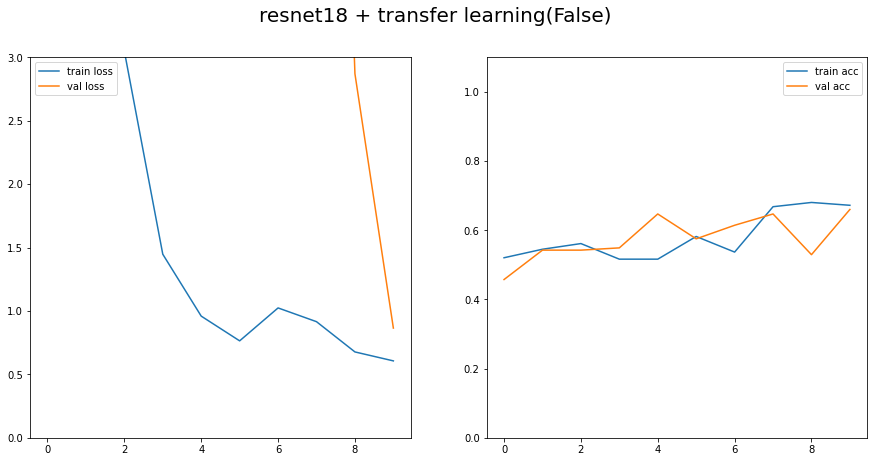

In [ ]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.plot(train_loss_history,label='train loss')
plt.plot(val_loss_history,label='val loss')
plt.ylim(0,3)
plt.legend()

plt.subplot(1,2,2)
plt.plot(train_acc_history,label='train acc')
plt.plot(val_acc_history,label='val acc')
plt.ylim(0,1.1)
plt.legend()

plt.suptitle(f'resnet18 + transfer learning({transfer_flag})',fontsize=20)

### Transfer Learning - Pytorch - Multi LR

In [ ]:
transfer_flag = True
model = models.resnet18(pretrained=transfer_flag, progress=True)

In [ ]:
n_features = model.fc.in_features  # 512
model.fc = torch.nn.Linear(n_features,2)

In [ ]:
params_group_1  = []  #
params_group_2  = []  # layer3, layer4
params_group_3  = []  # fc

for name, param in model.named_parameters():
    if 'fc' in name:
        params_group_3.append(param)
    elif name.find('layer3') >= 0 or name.find('layer4') >= 0:
        params_group_2.append(param)
    else:
        params_group_1.append(param)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
model.to(device)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD([{'params': params_group_1, 'lr': 1e-5 },{'params': params_group_2, 'lr': 1e-4 },{'params': params_group_3, 'lr': 1e-3 }], momentum=0.9)

cuda:0


In [ ]:
num_epochs = 20
s_time = time.time()

train_loss_history = []; val_loss_history = []
train_acc_history = []; val_acc_history  = []

for epoch in range(num_epochs):  # loop for epoch
    running_loss = []
    acc = 0; total = 0
    model.train()
    for i, data in enumerate(train_dataloader):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        loss = loss_fn(outputs, labels)
        loss.backward()
        optimizer.step()

        _, pred = outputs.max(axis=-1)
        acc  += (pred==labels).float().sum().item()
        total += len(labels)

        running_loss.append(loss.item())
    train_loss_history.append(np.mean(running_loss))
    train_acc_history.append(acc/total)
    print('[epoch: %d] loss: %.3f, train acc: %.3f elapsed: %.2f' % (epoch + 1, np.mean(running_loss), acc/total , time.time()-s_time))

    # validation
    running_loss = []
    acc = 0; total = 0;
    model.eval()
    with torch.no_grad():
        for i, data in enumerate(val_dataloader):
            inputs, labels = data
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            loss = loss_fn(outputs, labels)

            _, pred = outputs.max(axis=-1)
            acc  += (pred==labels).float().sum().item()
            total += len(labels)
            running_loss.append(loss.item())

    val_loss_history.append(np.mean(running_loss))
    val_acc_history.append(acc/total)
    print('val loss: %.3f, val acc: %.3f' % (np.mean(running_loss), acc/total))

print('Finished Training')

[epoch: 1] loss: 0.666, train acc: 0.611 elapsed: 3.68
val loss: 0.584, val acc: 0.667
[epoch: 2] loss: 0.594, train acc: 0.693 elapsed: 9.18
val loss: 0.547, val acc: 0.699
[epoch: 3] loss: 0.495, train acc: 0.775 elapsed: 14.67
val loss: 0.398, val acc: 0.908
[epoch: 4] loss: 0.404, train acc: 0.869 elapsed: 20.08
val loss: 0.335, val acc: 0.941
[epoch: 5] loss: 0.332, train acc: 0.922 elapsed: 25.44
val loss: 0.295, val acc: 0.941
[epoch: 6] loss: 0.304, train acc: 0.914 elapsed: 30.85
val loss: 0.269, val acc: 0.935
[epoch: 7] loss: 0.245, train acc: 0.934 elapsed: 36.22
val loss: 0.242, val acc: 0.954
[epoch: 8] loss: 0.214, train acc: 0.947 elapsed: 41.59
val loss: 0.221, val acc: 0.961
[epoch: 9] loss: 0.198, train acc: 0.947 elapsed: 47.27
val loss: 0.208, val acc: 0.967
[epoch: 10] loss: 0.214, train acc: 0.959 elapsed: 52.91
val loss: 0.197, val acc: 0.961
[epoch: 11] loss: 0.178, train acc: 0.963 elapsed: 58.28
val loss: 0.191, val acc: 0.967
[epoch: 12] loss: 0.164, train a

Text(0.5, 0.98, 'resnet18 + multi LR)')

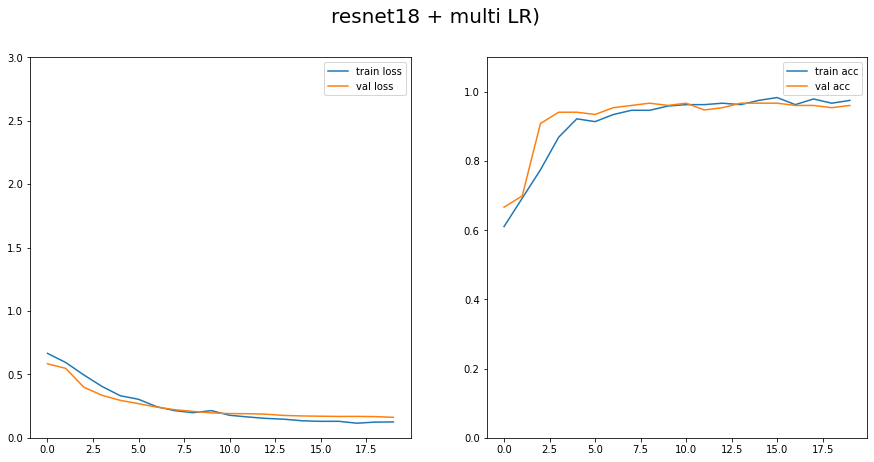

In [ ]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.plot(train_loss_history,label='train loss')
plt.plot(val_loss_history,label='val loss')
plt.ylim(0,3)
plt.legend()

plt.subplot(1,2,2)
plt.plot(train_acc_history,label='train acc')
plt.plot(val_acc_history,label='val acc')
plt.ylim(0,1.1)
plt.legend()

plt.suptitle(f'resnet18 + multi LR)',fontsize=20)

## 7.5.3 Transfer Learning - Tensorflow
- https://www.tensorflow.org/tutorials/load_data/images?hl=ko
- The Oxford-IIIT Pet Dataset(755M): 37종의 개, 고양이 품종 데이터 --> 7390개 파일
- 사이트의 설명에는 7349개로 나오지만, 모두 7390개 이다


In [ ]:
!wget https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
!tar -xzvf ./images.tar.gz
!rm ./images/*.mat  # 이미지가 아닌 파일 제거

In [ ]:
!echo total: `find . -type f | wc -l` ; for x in `ls` ; do echo $x: `find $x -type f | wc -l`; done
!find ./images -maxdepth 1 -mindepth 1 -type d -exec ls -ld "{}" \; -exec sh -c "find {} -type f | wc -l" \;

total: 7412
images: 7390
images.tar.gz: 1
sample_data: 6


In [ ]:
import os,glob,shutil,time
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.applications import resnet


In [ ]:
def move_files_to_subdirectory(base_dir):
    # 하나의 디렉토리에 모여 있는 파일을 각각의 sub directory로 이동
    category =['Abyssinian', 'Bengal', 'Birman', 'Bombay', 'British_Shorthair', 'Egyptian_Mau', 'Maine_Coon',
               'Persian', 'Ragdoll', 'Russian_Blue', 'Siamese', 'Sphynx', 'american_bulldog', 'american_pit_bull_terrier',
               'basset_hound', 'beagle', 'boxer', 'chihuahua', 'english_cocker_spaniel', 'english_setter',
               'german_shorthaired', 'great_pyrenees', 'havanese', 'japanese_chin', 'keeshond', 'leonberger',
               'miniature_pinscher', 'newfoundland', 'pomeranian', 'pug', 'saint_bernard', 'samoyed', 'scottish_terrier',
               'shiba_inu', 'staffordshire_bull_terrier', 'wheaten_terrier', 'yorkshire_terrier']

    # 디렉토리 만들기
    for c in category:
        dir_name = os.path.join(base_dir,c)
        os.makedirs(dir_name,exist_ok=True)

    all_files = glob.glob(os.path.join(base_dir,"*.jpg"))

    print("파일갯수: ", len(all_files))

    # file move
    for f in all_files:
        basename = os.path.basename(f)
        c = '_'.join(basename.split('_')[:-1])   # basset_hound_103.jpg --> ['basset', 'hound', '103.jpg']
        if os.path.exists(os.path.join(base_dir,c)):
            shutil.move(f,os.path.join(base_dir,c))

In [ ]:
base_dir ='./images'
move_files_to_subdirectory(base_dir)

파일갯수:  7390


In [ ]:
seed = 123
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
  base_dir,
  validation_split=0.2,
  subset="training",
  seed=seed,
  image_size=(256, 256),
  batch_size=None)

val_dataset = tf.keras.preprocessing.image_dataset_from_directory(
  base_dir,
  validation_split=0.2,
  subset="validation",
  seed=seed,
  image_size=(256, 256),
  batch_size=None)

Found 7390 files belonging to 37 classes.
Using 5912 files for training.
Found 7390 files belonging to 37 classes.
Using 1478 files for validation.


In [ ]:
class_names = train_dataset.class_names

n_class = len(class_names)
print('n_class: ', n_class)
print(class_names)

n_class:  37
['Abyssinian', 'Bengal', 'Birman', 'Bombay', 'British_Shorthair', 'Egyptian_Mau', 'Maine_Coon', 'Persian', 'Ragdoll', 'Russian_Blue', 'Siamese', 'Sphynx', 'american_bulldog', 'american_pit_bull_terrier', 'basset_hound', 'beagle', 'boxer', 'chihuahua', 'english_cocker_spaniel', 'english_setter', 'german_shorthaired', 'great_pyrenees', 'havanese', 'japanese_chin', 'keeshond', 'leonberger', 'miniature_pinscher', 'newfoundland', 'pomeranian', 'pug', 'saint_bernard', 'samoyed', 'scottish_terrier', 'shiba_inu', 'staffordshire_bull_terrier', 'wheaten_terrier', 'yorkshire_terrier']


In [ ]:
model_preprocessing = tf.keras.applications.resnet50.preprocess_input

def preprocessing(image,model_preprocessing=None,train_flag=True):
    # image: Tensorflow Tensor
    if train_flag:
        image = tf.image.random_flip_left_right(image)  # ~확률 0.5로 고정되어 있음.~
        image = tf.image.random_brightness(image, max_delta=0.3)
        image = tf.image.random_saturation(image, lower=0.5, upper=1.5)  # ~채도 조절~

        # random crop
        image = tf.image.random_crop(image,(224,224,3))
    else:
        image = tf.image.central_crop(image,0.875)  # 256 x 0.875 = 224

    if model_preprocessing:
        return model_preprocessing(image)
    else:
        return image

train_dataset_batch = train_dataset.map(lambda x,y: (preprocessing(x,model_preprocessing),y)).shuffle(buffer_size=1000).batch(64)
val_dataset_batch = val_dataset.map(lambda x,y: (preprocessing(x,model_preprocessing,False),y)).batch(8)

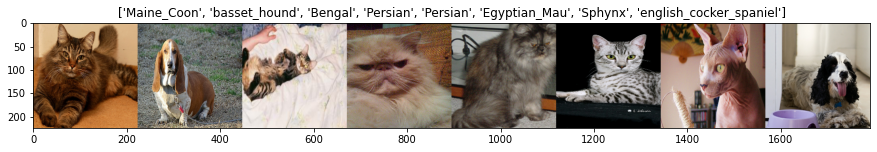

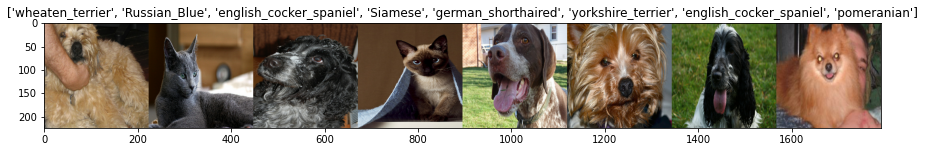

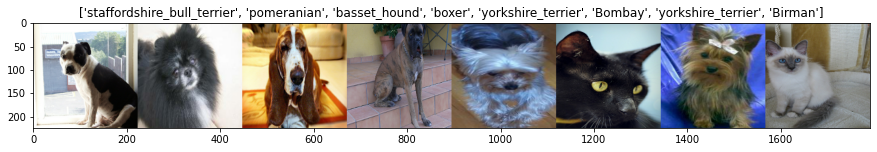

In [ ]:
#model_preprocessing = None  # 이미지 확인할 경우에는 None으로...
val_dataset_batch_temp = val_dataset.map(lambda x,y: (preprocessing(x,None,False),y)).batch(8)  # model_preprocessing = None
it = iter(val_dataset_batch_temp)
for i in range(3):
    inputs, classes = next(it)
    inputs = np.concatenate(inputs.numpy().astype(np.uint8), axis=1)
    plt.figure(figsize=(15,35))
    plt.imshow(inputs)
    plt.title([train_dataset.class_names[x] for x in classes])
    plt.show()

In [ ]:
def plot_history(history):
    # fit이 return하는 history plot
    fig, axs = plt.subplots(1,2,figsize=(12, 5))

    # create error sublpot
    axs[0].plot(history.history["loss"], label="train loss")
    axs[0].plot(history.history["val_loss"], label="val loss")
    axs[0].set_ylabel("Loss")
    axs[0].set_xlabel("Epoch")
    axs[0].set_title("Loss")
    axs[0].set_ylim(0,4)
    axs[0].legend()

    # create accuracy sublpot
    axs[1].plot(history.history["accuracy"], label="train accuracy")
    axs[1].plot(history.history["val_accuracy"], label="val accuracy")
    axs[1].set_ylabel("Accuracy")
    axs[1].set_title("Accuracy")
    axs[1].set_ylim(0,1.05)
    axs[1].legend()

    plt.show()

In [ ]:
pretrained_frozen_flag = False
transfer_flag = True

if transfer_flag:
    base_model = resnet.ResNet50(weights='imagenet',include_top=False)  # weights=None, weights='imagenet'
else:
    base_model = resnet.ResNet50(weights=None,include_top=False) # random weight initialization


if pretrained_frozen_flag:
    base_model.trainable = False  # Trainable params: 75,813 vs 23,610,405

model = tf.keras.Sequential([ base_model,tf.keras.layers.GlobalAveragePooling2D(),tf.keras.layers.Dense(n_class)])

In [ ]:
print('gpu available check:', tf.config.list_physical_devices('GPU'))
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.SGD(learning_rate=initial_learning_rate,momentum=0.9)

model.compile(optimizer,loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),metrics=['accuracy'])
model_filename = "Epoch-{epoch:02d}-{val_accuracy:.4f}"
checkpoint_path = os.path.join('./models_tf_resent50/', model_filename)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1,mode='auto',save_best_only=True,monitor='val_accuracy')

# lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
#                             monitor='val_accuracy',  # val acc를 기준으로...
#                             factor=0.6,          # callback 호출시 lr = factor*lr
#                             patience=10,         # patience epoch동안 monitor값이 좋아지지 않으면 callback 작동
#                             cooldown=0,         # lr이 변경된 후, cooldonw동안에는 callback이 작동 안 한다.
#                             min_lr=0.0001,
#                             verbose = 1,min_delta=0.001)

gpu available check: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
n_epochs = 10
history = model.fit(train_dataset_batch,epochs=n_epochs,validation_data=val_dataset_batch,validation_freq=1, verbose=1,callbacks=[cp_callback],initial_epoch=0)

Epoch 1/10
93/93 [==============================] - ETA: 0s - loss: 2.2971 - accuracy: 0.4427
Epoch 1: val_accuracy improved from -inf to 0.75034, saving model to ./models_tf_resent50/Epoch-01-0.7503
93/93 [==============================] - 63s 508ms/step - loss: 2.2971 - accuracy: 0.4427 - val_loss: 1.0632 - val_accuracy: 0.7503
Epoch 2/10
93/93 [==============================] - ETA: 0s - loss: 0.8129 - accuracy: 0.8185
Epoch 2: val_accuracy improved from 0.75034 to 0.85724, saving model to ./models_tf_resent50/Epoch-02-0.8572
93/93 [==============================] - 53s 495ms/step - loss: 0.8129 - accuracy: 0.8185 - val_loss: 0.6298 - val_accuracy: 0.8572
Epoch 3/10
93/93 [==============================] - ETA: 0s - loss: 0.5531 - accuracy: 0.8672
Epoch 3: val_accuracy improved from 0.85724 to 0.87957, saving model to ./models_tf_resent50/Epoch-03-0.8796
93/93 [==============================] - 53s 496ms/step - loss: 0.5531 - accuracy: 0.8672 - val_loss: 0.5012 - val_accuracy: 0.879

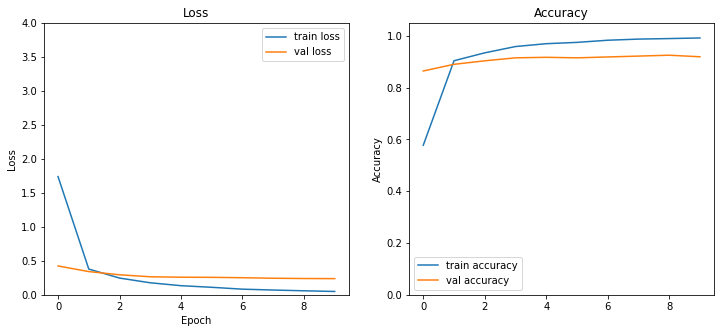

In [ ]:
# transfer learning: transfer_flag = True, pretrained_frozen_flag = False
plot_history(history)

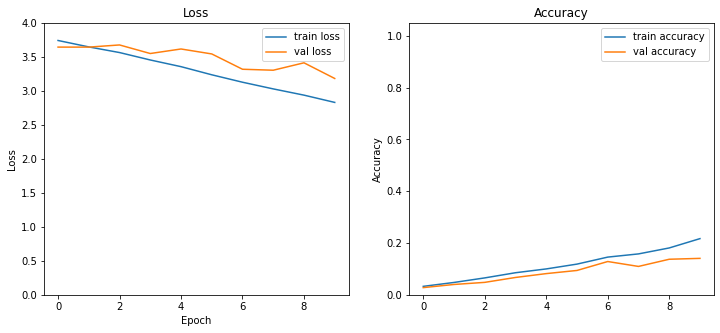

In [ ]:
# train from scratch:  transfer_flag = False, pretrained_frozen_flag = False
plot_history(history)

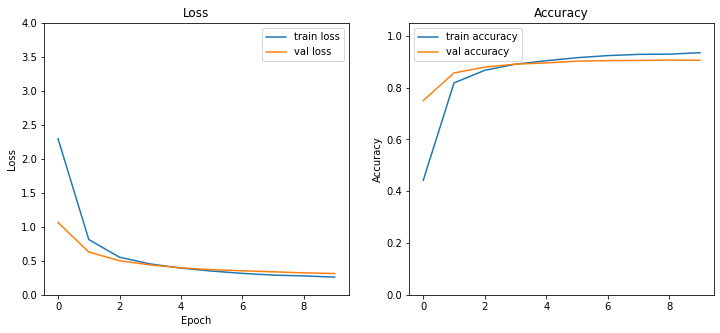

In [ ]:
# train from scratch:  transfer_flag = True, pretrained_frozen_flag = True
plot_history(history)

In [ ]:
history.history["loss"], history.history["val_loss"], history.history["accuracy"], history.history["val_accuracy"]

([2.297128677368164,
  0.8129132986068726,
  0.5531118512153625,
  0.45391738414764404,
  0.3928990066051483,
  0.34902721643447876,
  0.31545695662498474,
  0.28975972533226013,
  0.2779898941516876,
  0.2602010667324066],
 [1.0632264614105225,
  0.6298441886901855,
  0.5011664628982544,
  0.4397951364517212,
  0.3965980112552643,
  0.36958828568458557,
  0.35337162017822266,
  0.3383811116218567,
  0.3229147493839264,
  0.31270840764045715],
 [0.4426589906215668,
  0.8185047507286072,
  0.8672192096710205,
  0.8908998370170593,
  0.9042625427246094,
  0.9159336686134338,
  0.9240527749061584,
  0.9287889003753662,
  0.9296346306800842,
  0.93521648645401],
 [0.7503383159637451,
  0.8572394847869873,
  0.8795669674873352,
  0.8910689949989319,
  0.8958051204681396,
  0.9025710225105286,
  0.9046007990837097,
  0.9052774310112,
  0.9066305756568909,
  0.9059540033340454])

In [ ]:
base_model.trainable = True

n_epochs = 20  # 누적 epoch
history = model.fit(train_dataset_batch,epochs=n_epochs,validation_data=val_dataset_batch,validation_freq=1, verbose=1,callbacks=[cp_callback],initial_epoch=10)

Epoch 11/20
93/93 [==============================] - ETA: 0s - loss: 0.2414 - accuracy: 0.9388
Epoch 11: val_accuracy improved from 0.90663 to 0.91069, saving model to ./models_tf_resent50/Epoch-11-0.9107
93/93 [==============================] - 53s 488ms/step - loss: 0.2414 - accuracy: 0.9388 - val_loss: 0.3040 - val_accuracy: 0.9107
Epoch 12/20
93/93 [==============================] - ETA: 0s - loss: 0.2337 - accuracy: 0.9440
Epoch 12: val_accuracy did not improve from 0.91069
93/93 [==============================] - 52s 485ms/step - loss: 0.2337 - accuracy: 0.9440 - val_loss: 0.2991 - val_accuracy: 0.9080
Epoch 13/20
93/93 [==============================] - ETA: 0s - loss: 0.2186 - accuracy: 0.9493
Epoch 13: val_accuracy did not improve from 0.91069
93/93 [==============================] - 52s 495ms/step - loss: 0.2186 - accuracy: 0.9493 - val_loss: 0.2944 - val_accuracy: 0.9073
Epoch 14/20
93/93 [==============================] - ETA: 0s - loss: 0.2115 - accuracy: 0.9491
Epoch 14: 

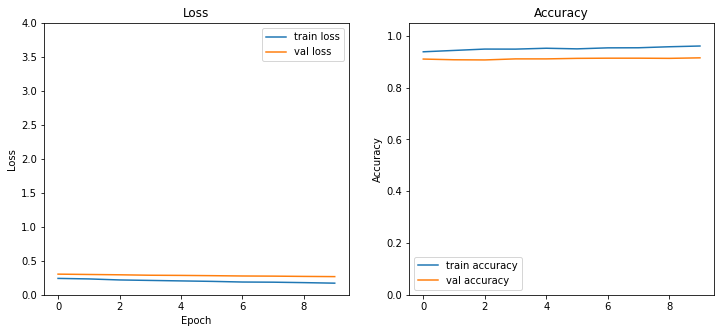

In [ ]:
# train from scratch:  transfer_flag = True, pretrained_frozen_flag = True  --> pretrained_frozen_flag = False로 풀고 추가 10 epoch
plot_history(history)